# Measles SEIRV model

![Mealskes model diagram](img/SEIRV.drawio.png)


In [6]:
import pandas as pd
import numpy as np
import random
from datetime import date
import geopandas as gpd
import os

from PIL import Image
from matplotlib.patches import ConnectionPatch
from IPython.display import Image
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import matplotlib.patches as mpatches
from shapely.geometry import mapping
import matplotlib.colors as mcolors

import pygris
from pygris import tracts 
from pygris import block_groups 
from pygris import primary_secondary_roads
from pygris import school_districts
from pygris import counties 
from pygris.geocode import geocode
from census import Census

from census import Census
# Builing a Compartmetal Model

from sympy import Max,  parse_expr
from sympy import symbols, Matrix

from epymorph import *
from epymorph.compartment_model import *

# Runing the Simulation
from functools import partial

import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
from geopandas import GeoDataFrame, GeoSeries

# Building a geo 
from typing import cast

In [12]:
geo_df = geo_library['maricopa_cbg_2019']().values
geo_df = pd.DataFrame({k: list(v) for k, v in geo_df.items()})
geo_df['population'] = geo_df['population_by_age'].apply(lambda x: x[0])
geo_df.head()

,average_household_size,centroid,geoid,label,median_age,median_income,pop_density_km2,population,population_by_age,population_by_age_x6,tract_gini_index,tract_median_income
0,2.33,"[-111.77075643330394, 33.76924660709943]",040130101011,040130101011,50.5,99219,99.319999,358,"[358, 1155, 278]","[358, 110, 671, 374, 194, 84]",0.4423,99489
1,2.15,"[-111.72000671148204, 33.7410933260103]",040130101012,040130101012,63.9,127614,68.782398,162,"[162, 883, 962]","[162, 0, 423, 460, 559, 403]",0.4423,99489
2,1.83,"[-111.66697569766907, 33.72404113568911]",040130101013,040130101013,70.8,80742,183.890869,0,"[0, 271, 993]","[0, 22, 0, 249, 655, 338]",0.4423,99489
3,2.04,"[-111.49136471795472, 33.71546544071483]",040130101021,040130101021,58.9,105987,0.480805,58,"[58, 775, 306]","[58, 52, 361, 362, 258, 48]",0.5439,134865
4,2.20,"[-111.8505100649063, 33.82609833466325]",040130101022,040130101022,62.8,128523,125.420289,110,"[110, 784, 593]","[110, 82, 202, 500, 452, 141]",0.5439,134865


In [ ]:

gravity_path = os.path.expanduser('~/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/gravity_sims')


# Creating Measles Geo


In [4]:
CentroidDType = np.dtype([('longitude', np.float64), ('latitude', np.float64)])

In [5]:
dir_path = os.path.expanduser('~/Desktop/Github/EpiMoRPH-Modeling/social-determinate-of-health/scratch/Movement_model')
filename = 'matrix_array.npy'
file_path = os.path.join(dir_path, filename)

loaded_array = np.load(file_path)
loaded_array


array([[  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       ...,
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0, 353]])

In [6]:
spec = StaticGeoSpec(
    attributes=[
        AttribDef('label', np.str_, Shapes.N),
        AttribDef('geoid', np.str_, Shapes.N),
        AttribDef('centroid', CentroidDType, Shapes.N),
        AttribDef('population', np.int64, Shapes.N),
        AttribDef('school_commuters', np.int64, Shapes.NxN),
  
    ],
    time_period=Year(2019))
spec

StaticGeoSpec(attributes=[AttribDef(name='label', dtype=<class 'numpy.str_'>, shape=Node()), AttribDef(name='geoid', dtype=<class 'numpy.str_'>, shape=Node()), AttribDef(name='centroid', dtype=dtype([('longitude', '<f8'), ('latitude', '<f8')]), shape=Node()), AttribDef(name='population', dtype=<class 'numpy.int64'>, shape=Node()), AttribDef(name='school_commuters', dtype=<class 'numpy.int64'>, shape=NodeAndNode())], time_period=Year(year=2019))

In [7]:
label = np.array(geo_df['label'], dtype=np.str_)
population = np.array(geo_df['population'], dtype=np.int64)
geoid = np.array(geo_df['geoid'], dtype=np.str_)
centroid = np.array(geo_df['centroid'], dtype=CentroidDType)
commuters = np.array(loaded_array, dtype=np.int64)


In [8]:
from epymorph.error import GeoValidationException
from epymorph.geo.static import StaticGeo

geo = StaticGeo(spec, {
    'label': label,
    'centroid': centroid,
    'geoid': geoid,
    'population': population,
    'school_commuters': commuters,
})

try:
    geo.validate()
except GeoValidationException as e:
    print(e.pretty())

In [9]:
from pathlib import Path

from epymorph.geo.static import StaticGeoFileOps

filename = StaticGeoFileOps.to_archive_filename('measles_geo_communters')
filepath = Path('epymorph/data/geo') / filename

geo.save(filepath)

In [41]:
measles_geo_df = geo_library['measles_geo_communters']().values
measles_geo_df = pd.DataFrame({k: list(v) for k, v in measles_geo_df.items()})

measles_geo_df

,centroid,geoid,label,population,school_commuters
0,"[-111.77075643330394, 33.76924660709943]",040130101011,040130101011,358,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
1,"[-111.72000671148204, 33.7410933260103]",040130101012,040130101012,162,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2,"[-111.66697569766907, 33.72404113568911]",040130101013,040130101013,0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,"[-111.49136471795472, 33.71546544071483]",040130101021,040130101021,58,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,"[-111.8505100649063, 33.82609833466325]",040130101022,040130101022,110,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
...,...,...,...,...,...
2489,"[-111.87417248956888, 33.51676571547603]",040139413001,040139413001,805,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2490,"[-111.75549278099597, 33.52975077659579]",040139413002,040139413002,174,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2491,"[-111.88183665206864, 33.4507490858319]",040139413003,040139413003,62,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2492,"[-111.84018577905717, 33.49859253583006]",040139413004,040139413004,1157,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [42]:
measles_geo_df['population'].sum()

1159932

In [ ]:
1_159_932

In [10]:
dir = os.path.expanduser('~/Desktop/Github/EpiMoRPH-Modeling/social-determinate-of-health/scratch/Movement_model')
dir_2 = os.path.expanduser('~/Desktop/Github/EpiMoRPH-Modeling/social-determinate-of-health/scratch/')

powerpoint = os.path.expanduser('~/Desktop/Github/EpiMoRPH-Modeling/social-determinate-of-health/scratch/powerpoints/School_movement_01-22-24')
census = Census('98a3a86a5708b65b92a50cc76d8d67280efbeb5d')

In [13]:
explicit_df = pd.DataFrame(geo_df[['population', 'geoid']])
explicit_df.columns = ['S', 'geoid']
explicit_df['E'] = 0
explicit_df['I'] = 0
explicit_df['R'] = 0

infected_seed_locations = ['040134223021', '040134223042', '040134223053', '040134223072',
       '040138149002', '040138150003', '040138154001', '040134226411',
       '040134226412', '040134226422', '040134226431', '040134226432',
       '040134226441', '040138144002', '040134225092', '040134224011',
       '040138176001', '040134226061', '040134223082', '040134223083',
       '040134224021', '040134223093', '040134224033', '040138154003',
       '040134226171', '040134225093', '040134226213', '040134226222',
       '040134226231', '040134226232', '040138146001', '040134225072',
       '040134225103', '040134225112', '040134225122', '040134226062',
       '040134226063', '040134226173', '040134226201']

initial_infected_size = np.zeros(len(infected_seed_locations))

# Step 2: Decide on the total number of infections to distribute
total_infections = 4  # Example total infections

# Step 3: Randomly distribute the infections
np.random.seed(34)  # Set the seed for reproducibility
random_indices = np.random.choice(len(initial_infected_size), size=total_infections, replace=True)
for index in random_indices:
    initial_infected_size[index] += 1

for geoid, infected_count in zip(infected_seed_locations, initial_infected_size):
    if geoid in explicit_df['geoid'].values:
        row_index = explicit_df[explicit_df['geoid'] == geoid].index[0]
        explicit_df.at[row_index, 'I'] = infected_count

vaccinated_individuals = np.floor(explicit_df['S'] * 0.92).astype(int)
explicit_df['VR_1'] = np.floor(vaccinated_individuals * 0.95).astype(int)
explicit_df['VS_1'] = vaccinated_individuals - explicit_df['VR_1']
explicit_df['V_2'] = 0
explicit_df['S'] = explicit_df['S'] - vaccinated_individuals

indices = [explicit_df[explicit_df['geoid'] == geoid].index[0] for geoid in infected_seed_locations]

explicit_df = explicit_df[['S', 'E', 'I', 'R', 'VS_1', 'VR_1', 'V_2']]

initials_array = explicit_df.to_numpy(dtype=int)

initials_array[:5]

array([[ 29,   0,   0,   0,  17, 312,   0],
       [ 13,   0,   0,   0,   8, 141,   0],
       [  0,   0,   0,   0,   0,   0,   0],
       [  5,   0,   0,   0,   3,  50,   0],
       [  9,   0,   0,   0,   6,  95,   0]])

In [44]:
explicit_df['S'].sum()

93938

In [14]:
STATE = 'AZ'
COUNTY = 'Maricopa'
YEAR = 2019

In [6]:
districts = school_districts(state = STATE, year = YEAR)
census_counties = counties(state = STATE, year = YEAR)
census_block_groups = block_groups(state = STATE, county = COUNTY, year = YEAR, cache=False)
census_tracts = tracts(state = STATE, county = COUNTY, year = YEAR, cache=False)

Using FIPS code '04' for input 'AZ'
Using FIPS code '04' for input 'AZ'
Using FIPS code '04' for input 'AZ'
Using FIPS code '013' for input 'Maricopa'
Using FIPS code '04' for input 'AZ'
Using FIPS code '013' for input 'Maricopa'


In [15]:
def construct_ipm():
    symbols = create_symbols(
        compartments=[
            compartment('S'),
            compartment('E'),
            compartment('I'),
            compartment('R'),
            compartment('VS_1'),
            compartment('VR_1'),
            compartment('V_2'),
        ],
        attributes=[
            param('beta_s', shape=Shapes.TxN),
            param('beta_v', shape=Shapes.TxN),
            param('alpha', shape=Shapes.TxN),
            param('gamma', shape=Shapes.TxN),
            param('omega', shape=Shapes.TxN),
        ])

    [S, E, I, R, VS_1, VR_1, V_2] = symbols.compartment_symbols
    [β_s, β_v, α, γ, ω] = symbols.attribute_symbols

    N = Max(1, S, E, I, R, VS_1, VR_1, V_2)

    return create_model(
        symbols=symbols,
        transitions=[
            edge(S, E, rate = β_s * S * I / N),
            edge(E, I, rate = (1/α) * E),
            edge(I, R, rate = (1/γ) * I),
            
            edge(VS_1, E, rate = β_v * VS_1 * I / N),
            edge(VS_1, V_2, rate = ω * VS_1),
            
            edge(VR_1, V_2, rate = ω * V_2),
        ]
    )

sirv_ipm = construct_ipm()
phi = 10

Running simulation (StandardSimulation):
• 2019-07-20 to 2019-07-27 (7 days)
• 2494 geo nodes
|####################| 100% 
Runtime: 42.274s


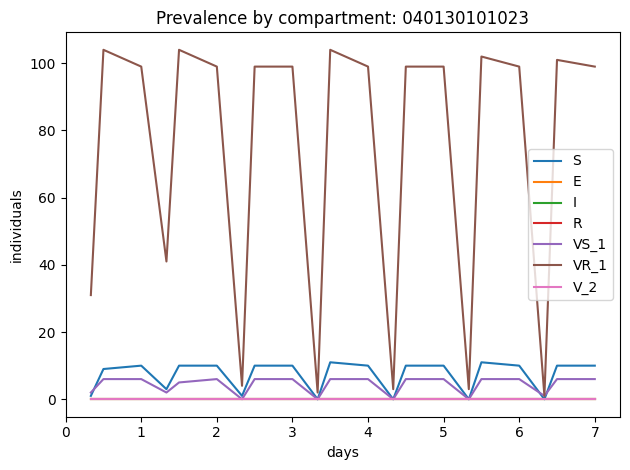

In [8]:
sim = StandardSimulation(
        geo =  geo_library['measles_geo_communters'](),
        ipm = sirv_ipm,
        mm = mm_library['school'](),
        params={
            'beta_s': 1.6,
            'beta_v': 0.3,
            'alpha': 20, 
            'gamma': 10,
            'omega': 0.0000023,
            'sigma': 0.12,  
            'phi': phi,
            'move_control': 0.1,
            'theta': 0.2
        },
        time_frame=TimeFrame.of("2019-07-20", 7),
        initializer=partial(explicit, initials=initials_array)
    )

with sim_messaging(sim):
    output = sim.run()
plot_pop(output, pop_idx=5)

single_simulation_out = f'/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/{phi}_single_simulation_out.csv'
save_csv(path=single_simulation_out, out = output )

In [24]:
[*range(2,5)]

[2, 3, 4]

In [33]:
range(19,21)

range(19, 21)

In [34]:
for i in range(19,21):
    sim = StandardSimulation(
        geo = geo_library['measles_geo_communters'](),
        ipm=sirv_ipm,
        mm=mm_library['school'](),
        params={
            'beta_s': 1.4,
            'beta_v': 0.6,
            'alpha': 20, 
            'gamma': 10,
            'omega': 0.0000023,
            'sigma': 0.12,  
            'phi': phi,
            'phi_weekend': 20,
            'move_control': 0.1,
            'theta': 0.2
        },
        time_frame=TimeFrame.of("2019-01-01", 252),
        initializer=partial(explicit, initials=initials_array)
    )

    with sim_messaging(sim):
        output = sim.run()
    
    out_file = f'/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/{phi}_{i}_communters_out.csv'
    save_csv(path=out_file, out = output )

Running simulation (StandardSimulation):
• 2019-01-01 to 2019-09-10 (252 days)
• 2494 geo nodes
|####################| 100% 
Runtime: 1522.949s
Running simulation (StandardSimulation):
• 2019-01-01 to 2019-09-10 (252 days)
• 2494 geo nodes
|####################| 100% 
Runtime: 1538.711s


In [35]:
for i in range(2,3):
    sim = StandardSimulation(
        geo = geo_library['measles_geo_communters'](),
        ipm=sirv_ipm,
        mm=mm_library['school'](),
        params={
            'beta_s': 1.4,
            'beta_v': 0.6,
            'alpha': 20, 
            'gamma': 10,
            'omega': 0.0000023,
            'sigma': 0.12,  
            'phi': phi,
            'phi_weekend': 20,
            'move_control': 0.1,
            'theta': 0.2
        },
        time_frame=TimeFrame.of("2019-01-01", 252),
        initializer=partial(explicit, initials=initials_array)
    )

    with sim_messaging(sim):
        output = sim.run()
    
    out_file = f'/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/{phi}_{i}_communters_out.csv'
    save_csv(path=out_file, out = output )

Running simulation (StandardSimulation):
• 2019-01-01 to 2019-09-10 (252 days)
• 2494 geo nodes


KeyboardInterrupt: 

In [31]:
for i in range(9,10):
    sim = StandardSimulation(
        geo = geo_library['measles_geo_communters'](),
        ipm=sirv_ipm,
        mm=mm_library['school'](),
        params={
            'beta_s': 1.4,
            'beta_v': 0.6,
            'alpha': 20, 
            'gamma': 10,
            'omega': 0.0000023,
            'sigma': 0.12,  
            'phi': phi,
            'phi_weekend': 20,
            'move_control': 0.1,
            'theta': 0.2
        },
        time_frame=TimeFrame.of("2019-01-01", 252),
        initializer=partial(explicit, initials=initials_array)
    )

    with sim_messaging(sim):
        output = sim.run()
    
    out_file = f'/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/{phi}_{i}_communters_out.csv'
    save_csv(path=out_file, out = output )

Running simulation (StandardSimulation):
• 2019-01-01 to 2019-09-10 (252 days)
• 2494 geo nodes
|####################| 100% 
Runtime: 1521.847s


In [11]:
[*range(5)]

[0, 1, 2, 3, 4]

In [5]:
import pandas as pd
import matplotlib.pyplot as plt

base_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/'
dataframe = pd.DataFrame()

csv_header = ['ticks', 'CGB', 'S', 'E', 'I', 'R', 'VS_1', 'VR_1', 'V', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']

max_days = 0

for i in range(20):
    file_path = f'{base_path}10_{i}_communters_out.csv'
    
    df = pd.read_csv(file_path, header=None, skiprows=1, names=csv_header)
    
    grouped_df = df.groupby('ticks')['I'].sum().reset_index()
    
    grouped_df['ticks'] = grouped_df['ticks'].apply(lambda x: (x + 3) // 3)
    
    if grouped_df.shape[0] > max_days:
        max_days = grouped_df.shape[0]
    
    dataframe[f'Sim_{i+1}'] = grouped_df['I'].reindex(range(max_days)).values


dataframe

,Sim_1,Sim_2,Sim_3,Sim_4,Sim_5,Sim_6,Sim_7,Sim_8,Sim_9,Sim_10,Sim_11,Sim_12,Sim_13,Sim_14,Sim_15,Sim_16,Sim_17,Sim_18,Sim_19,Sim_20
0,1,1,0,4,4,4,4,3,4,3,3,4,4,4,4,4,4,3,4,4
1,1,1,0,4,4,4,4,3,4,3,3,4,4,4,4,4,4,2,3,4
2,1,1,0,4,4,4,4,3,4,3,3,3,4,4,4,4,4,1,3,4
3,1,1,0,4,4,4,4,3,4,3,2,3,4,4,4,4,4,1,3,3
4,1,1,0,4,4,4,4,3,4,3,2,3,4,4,4,4,4,1,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
751,55,0,0,252,294,531,196,79,463,76,210,292,68,139,282,101,156,152,0,0
752,50,0,0,253,299,533,191,81,459,76,210,301,67,142,292,99,153,154,0,0
753,49,0,0,257,299,537,197,82,460,75,205,301,68,142,295,97,156,153,0,0
754,49,0,0,260,302,547,194,84,470,76,202,301,68,142,298,97,157,153,0,0


In [7]:
import pandas as pd
import matplotlib.pyplot as plt

base_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/'
dataframe = pd.DataFrame()

csv_header = ['ticks', 'CGB', 'S', 'E', 'I', 'R', 'VS_1', 'VR_1', 'V', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']

max_days = 0
weekday_phi = [10, 20, 30]
weekend_phi = [10, 20, 30]

for i in weekday_phi:
    for j in weekend_phi:
        for run in range(50):
        
            file_path = f'{base_path}{j}_{i}_out.csv'
            
            df = pd.read_csv(file_path, header=None, skiprows=1, names=csv_header)
            
            grouped_df = df.groupby('ticks')['I'].sum().reset_index()
            
            grouped_df['ticks'] = grouped_df['ticks'].apply(lambda x: (x + 3) // 3)
            
            if grouped_df.shape[0] > max_days:
                max_days = grouped_df.shape[0]
            
            dataframe[f'Gravity {i}-{j}'] = grouped_df['I'].reindex(range(max_days)).values


dataframe

,ticks,I
0,0,3
1,0,2
2,1,1
3,1,1
4,1,1
...,...,...
751,250,152
752,251,154
753,251,153
754,251,153


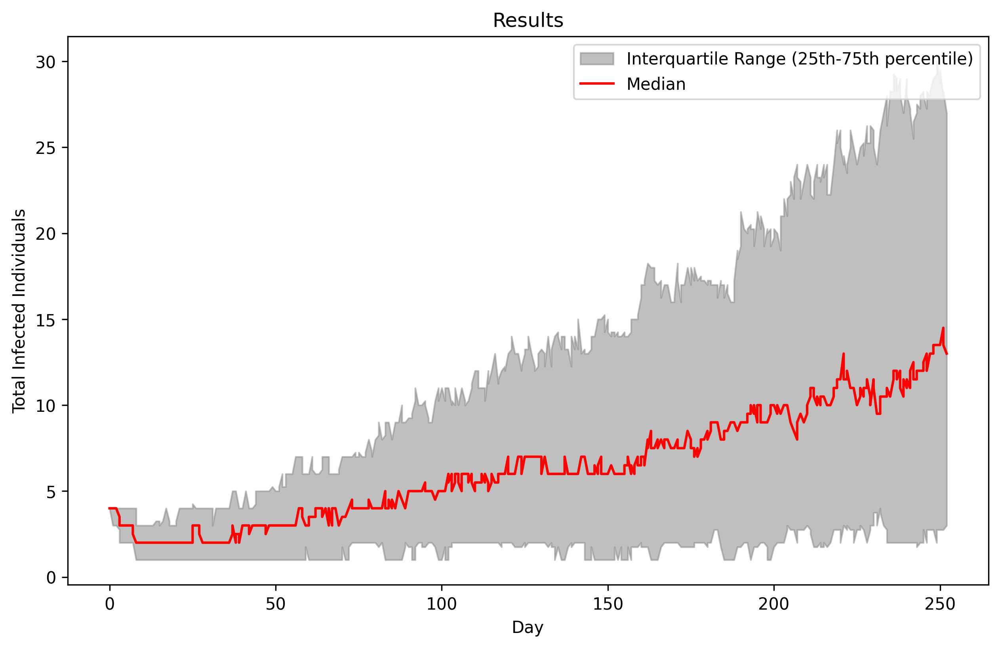

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

base_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/Weekend_and_weekday/'
dataframe = pd.DataFrame()

csv_header = ['ticks', 'CGB', 'S', 'E', 'I', 'R', 'VS_1', 'VR_1', 'V', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']

max_days = 0

# Adjust the range to exclude simulations 2, 3, 19, and 20
excluded_sims = [101]
for i in [x for x in range(80) if x not in excluded_sims]:
    file_path = f'{base_path}movement_{i}_out.csv'
    
    df = pd.read_csv(file_path, header=None, skiprows=1, names=csv_header)
    grouped_df = df.groupby('ticks')['I'].sum().reset_index()
    grouped_df['ticks'] = grouped_df['ticks'].apply(lambda x: (x + 1) // 2)
    
    if grouped_df.shape[0] > max_days:
        max_days = grouped_df.shape[0]
    
    dataframe[f'Sim_{i}'] = grouped_df['I'].reindex(range(max_days)).values

dataframe.index = (dataframe.index + 1) // 2

median_values = dataframe.median(axis=1)

quartile_25 = dataframe.quantile(0.25, axis=1)
quartile_75 = dataframe.quantile(0.75, axis=1)
min_values = dataframe.min(axis=1)
max_values = dataframe.max(axis=1)

plt.figure(figsize=(10, 6), dpi = 300)

plt.fill_between(dataframe.index, quartile_25, quartile_75, color='grey', alpha=0.5, label='Interquartile Range (25th-75th percentile)')
plt.plot(dataframe.index, median_values, color='red', label='Median')

plt.xlabel('Day')
plt.ylabel('Total Infected Individuals')
plt.title('Results')
plt.legend()

plt.show()

In [26]:
dataframe

,Sim_0,Sim_1,Sim_2,Sim_3,Sim_4,Sim_5,Sim_6,Sim_7,Sim_8,Sim_9,...,Sim_70,Sim_71,Sim_72,Sim_73,Sim_74,Sim_75,Sim_76,Sim_77,Sim_78,Sim_79
0,4,4,4,4,4,4,4,4,4,3,...,4,4,4,4,4,4,3,4,4,4
1,4,4,4,3,3,4,3,4,4,2,...,4,4,4,4,4,3,3,3,4,4
1,4,4,4,3,3,4,3,4,5,2,...,4,4,4,4,4,3,3,3,4,4
2,3,4,5,3,2,4,3,4,5,2,...,4,4,4,4,4,3,2,3,4,4
2,3,4,5,3,2,4,3,4,5,2,...,3,4,4,4,4,3,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
250,19,0,36,0,20,8,6,35,45,5,...,35,15,44,0,0,28,15,9,18,11
250,18,0,36,0,19,8,8,35,43,5,...,35,15,39,0,0,29,16,9,17,11
251,17,0,37,0,20,8,9,33,40,5,...,33,15,37,0,0,27,17,9,19,12
251,17,0,37,0,22,8,9,33,37,5,...,32,14,38,0,0,27,18,9,18,12


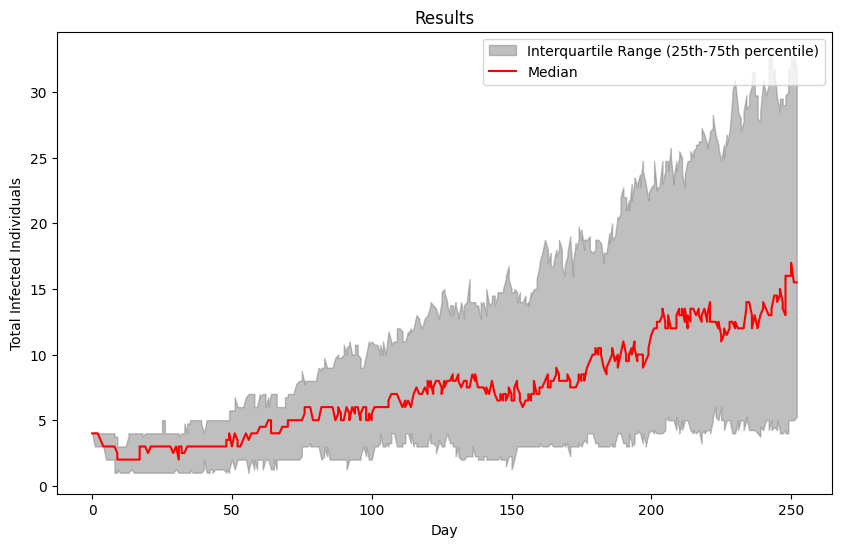

In [19]:

median_values = dataframe.median(axis=1)

# Continue with the provided code
quartile_25 = dataframe.quantile(0.25, axis=1)
quartile_75 = dataframe.quantile(0.75, axis=1)
min_values = dataframe.min(axis=1)
max_values = dataframe.max(axis=1)

# Plotting
plt.figure(figsize=(10, 6))

# Fill between quartiles
plt.fill_between(dataframe.index, quartile_25, quartile_75, color='grey', alpha=0.5, label='Interquartile Range (25th-75th percentile)')

# Plot median
plt.plot(dataframe.index, median_values, color='red', label='Median')

plt.xlabel('Day')
plt.ylabel('Total Infected Individuals')
plt.title('Results')
plt.legend()

plt.show()


In [ ]:
, 

In [50]:
from math import radians, cos, sin, sqrt, atan2

phi1 = 40.68296180577121
phi2 = 32.84091596
lambda1 = -73.93716293835269
lambda2 = -112.74293854

phi1_rad = radians(phi1)
phi2_rad = radians(phi2)
lambda1_rad = radians(lambda1)
lambda2_rad = radians(lambda2)

R = 6371.0

delta_phi = phi2_rad - phi1_rad
delta_lambda = lambda2_rad - lambda1_rad
a = sin(delta_phi / 2)**2 + cos(phi1_rad) * cos(phi2_rad) * sin(delta_lambda / 2)**2
c = 2 * atan2(sqrt(a), sqrt(1 - a))
haversine_distance = R * c

x1 = R * cos(phi1_rad) * cos(lambda1_rad)
y1 = R * cos(phi1_rad) * sin(lambda1_rad)
z1 = R * sin(phi1_rad)

x2 = R * cos(phi2_rad) * cos(lambda2_rad)
y2 = R * cos(phi2_rad) * sin(lambda2_rad)
z2 = R * sin(phi2_rad)

euclidean_distance = sqrt((x2 - x1)**2 + (y2 - y1)**2 + (z2 - z1)**2)

haversine_distance, euclidean_distance


(3534.496430403303, 3489.3435770447095)

In [51]:

absolute_difference = abs(haversine_distance - euclidean_distance)
absolute_difference

45.15285335859335

/var/folders/_v/4q2_l88n1vndy51_ksbfylnc0000gn/T/ipykernel_7148/3512158786.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  dataframe[f'Sim_{i}'] = grouped_df['I'].reindex(range(max_days)).fillna(method='ffill').values  # Use forward fill for missing values
/var/folders/_v/4q2_l88n1vndy51_ksbfylnc0000gn/T/ipykernel_7148/3512158786.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  dataframe[f'Sim_{i}'] = grouped_df['I'].reindex(range(max_days)).fillna(method='ffill').values  # Use forward fill for missing values
/var/folders/_v/4q2_l88n1vndy51_ksbfylnc0000gn/T/ipykernel_7148/3512158786.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  dataframe[f'Sim_{i}'] = grouped_df['I'].reindex(range(max_days)).fillna(method='f

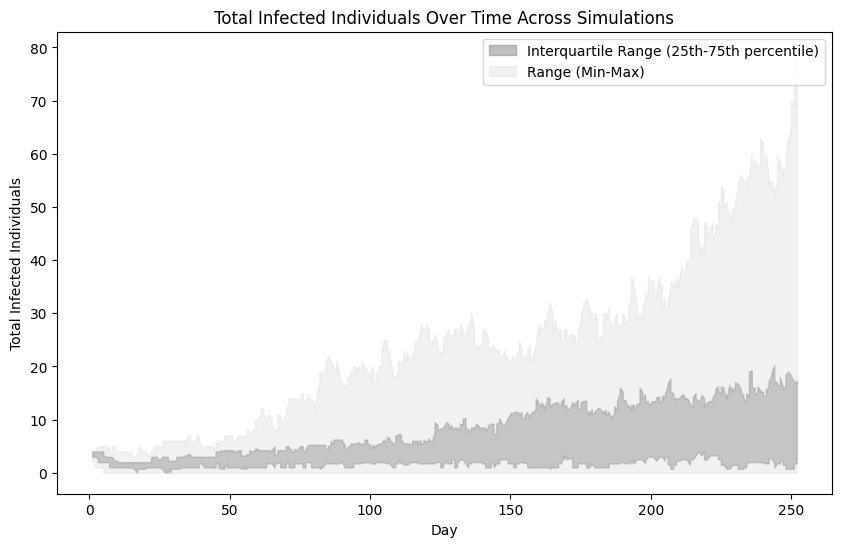

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

base_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/gravity_sims/'
dataframe = pd.DataFrame()

csv_header = ['ticks', 'CGB', 'S', 'E', 'I', 'R', 'VS_1', 'VR_1', 'V', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']

max_days = 0

# Adjust the range to exclude simulations 2, 3, 19, and 20
excluded_sims = [2, 3, 19, 20]
for i in [x for x in range(1, 21) if x not in excluded_sims]:
    file_path = f'{base_path}10_{i}_out.csv'  # Adjusted file naming to match your original format
    
    df = pd.read_csv(file_path, skiprows=1, names=csv_header)
    
    # Aggregating 'I' column values
    grouped_df = df.groupby('ticks')['I'].sum().reset_index()
    grouped_df['ticks'] = grouped_df['ticks'].apply(lambda x: np.ceil(x / 3).astype(int))  # Adjust tick grouping
    
    # Extend dataframe to accommodate the longest simulation
    if grouped_df.shape[0] > max_days:
        max_days = grouped_df.shape[0]
    
    # Adding simulation data to the dataframe
    dataframe[f'Sim_{i}'] = grouped_df['I'].reindex(range(max_days)).fillna(method='ffill').values  # Use forward fill for missing values

# Adjust index to match day grouping
dataframe.index = np.ceil((dataframe.index + 1) / 2).astype(int)

# Calculate quartiles, min, and max
quartile_25 = dataframe.quantile(0.25, axis=1)
quartile_75 = dataframe.quantile(0.75, axis=1)
min_values = dataframe.min(axis=1)
max_values = dataframe.max(axis=1)

# Plotting
plt.figure(figsize=(10, 6))

plt.fill_between(dataframe.index, quartile_25, quartile_75, color='grey', alpha=0.5, label='Interquartile Range (25th-75th percentile)')
plt.fill_between(dataframe.index, min_values, max_values, color='lightgrey', alpha=0.3, label='Range (Min-Max)')

plt.xlabel('Day')
plt.ylabel('Total Infected Individuals')
plt.title('Total Infected Individuals Over Time Across Simulations')
plt.legend()

plt.show()


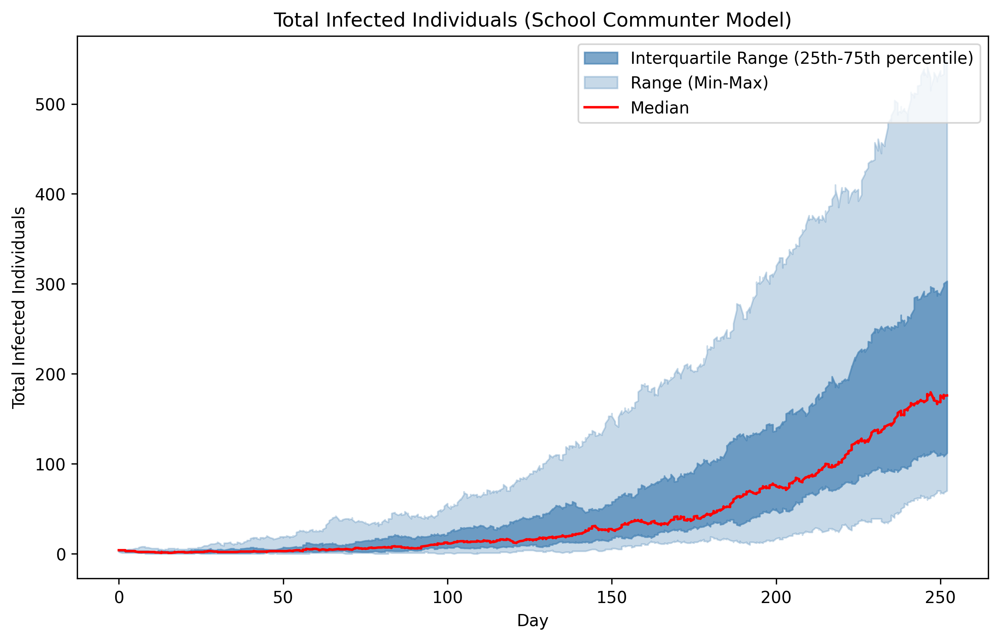

In [32]:
quartile_25 = dataframe.quantile(0.25, axis=1)
quartile_75 = dataframe.quantile(0.75, axis=1)
min_values = dataframe.min(axis=1)
max_values = dataframe.max(axis=1)
median_values = dataframe.median(axis=1)

# Plotting
plt.figure(figsize=(10, 6), dpi = 300)

plt.fill_between(dataframe.index, quartile_25, quartile_75, color='steelblue', alpha=0.7, label='Interquartile Range (25th-75th percentile)')
plt.fill_between(dataframe.index, min_values, max_values, color='steelblue', alpha=0.3, label='Range (Min-Max)')
plt.plot(dataframe.index, median_values, color='red', label='Median')

plt.xlabel('Day')
plt.ylabel('Total Infected Individuals')
plt.title('Total Infected Individuals (School Communter Model)')
plt.legend()

plt.show()

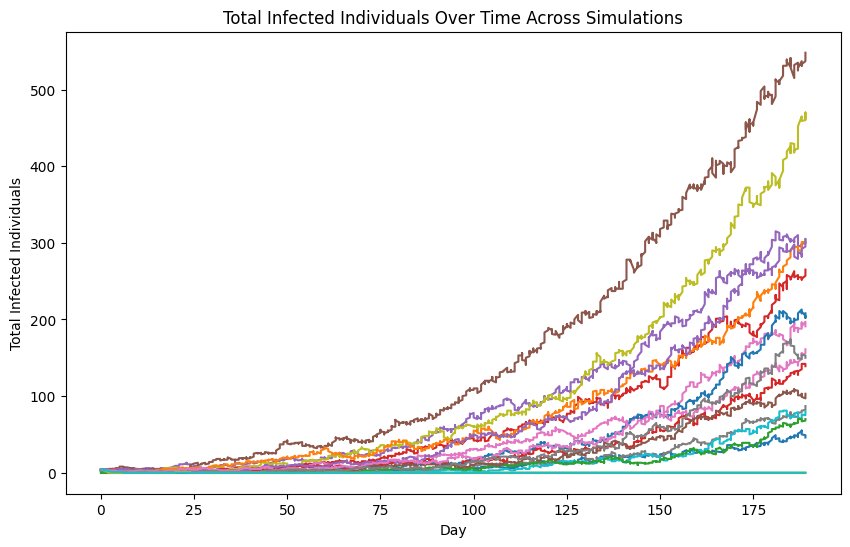

In [21]:
# Correct the index to match the adjusted 'ticks'
dataframe.index = (dataframe.index + 1) // 2

# Plotting the summed and adjusted data for visualization
plt.figure(figsize=(10, 6))
for column in dataframe.columns:
    plt.plot(dataframe.index, dataframe[column], label=column)
plt.xlabel('Day')
plt.ylabel('Total Infected Individuals')
plt.title('Total Infected Individuals Over Time Across Simulations')
plt.show()

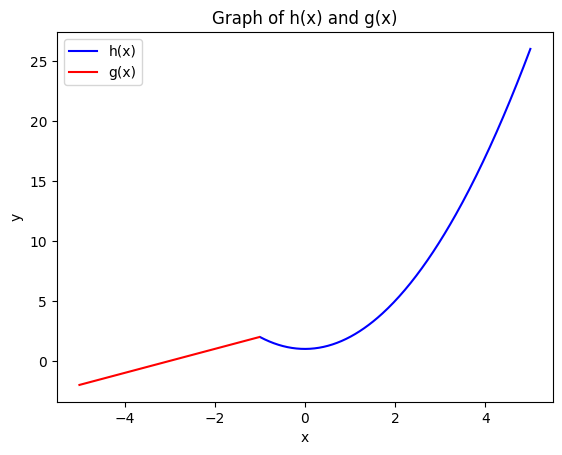

In [40]:
import numpy as np
import matplotlib.pyplot as plt

def h(x):
    return np.where(x > -1, x**2 + 1, np.nan)

def g(x):
    return np.where(x <= -1, x + 3, np.nan)

x_values = np.linspace(-5, 5, 400)

plt.plot(x_values, h(x_values), label='h(x)', color='blue')

plt.plot(x_values, g(x_values), label='g(x)', color='red')

plt.xlabel('x')
plt.ylabel('y')
plt.title('Graph of h(x) and g(x)')
plt.legend()

plt.show()


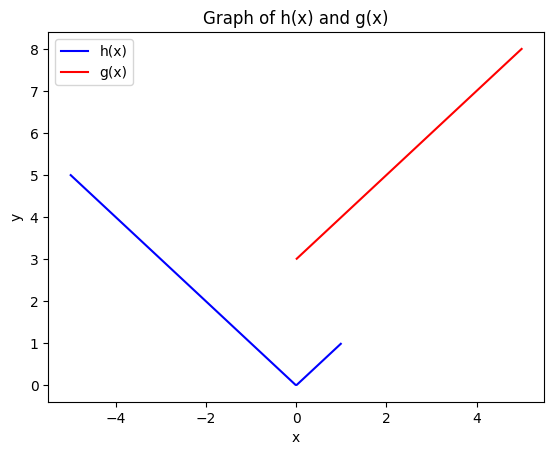

In [37]:
def h(x):
    return np.where(x <= 1, np.abs(x), np.nan)

def g(x):
    return np.where(x >= 0, x + 3, np.nan)

plt.plot(x_values, h(x_values), label='h(x)', color='blue')

plt.plot(x_values, g(x_values), label='g(x)', color='red')

plt.xlabel('x')
plt.ylabel('y')
plt.title('Graph of h(x) and g(x)')
plt.legend()

plt.show()

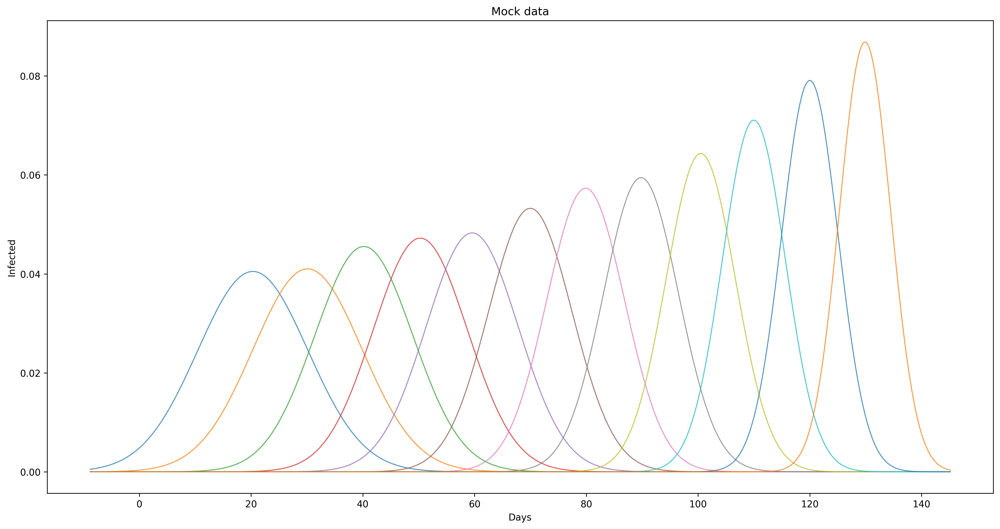

In [83]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

district_data = [
    np.random.normal(loc=20 + i*10, scale=max(1, 10 - 0.5*i), size=1000) for i in range(12)
]

fig, ax1 = plt.subplots(figsize=(15, 8), dpi = 300)

global_min = min([np.min(data) for data in district_data])
global_max = max([np.max(data) for data in district_data])
x_range = np.linspace(global_min, global_max, 1000)

total_pdf = np.zeros_like(x_range)

for i, data in enumerate(district_data):
    mu, sigma = norm.fit(data)
    pdf = norm.pdf(x_range, mu, sigma)
    total_pdf += pdf  
    ax1.plot(x_range, pdf, linewidth=1, alpha=0.8, label=f'District {i+1} (mu={mu:.2f}, sigma={sigma:.2f})')


plt.xlabel('Days')
plt.ylabel('Infected')
plt.title('Mock data')
fig.tight_layout()

# Show the plot
plt.show()


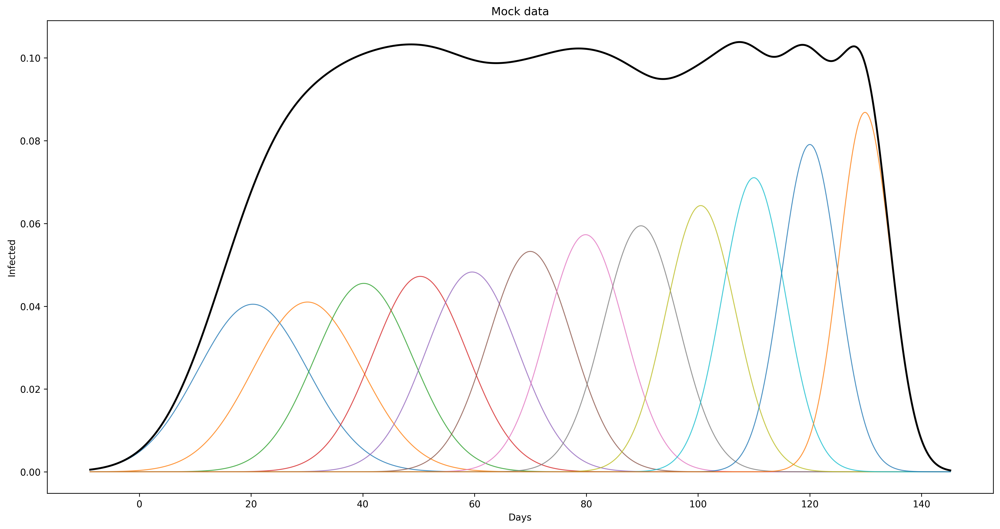

In [85]:
fig, ax1 = plt.subplots(figsize=(15, 8), dpi = 300)

global_min = min([np.min(data) for data in district_data])
global_max = max([np.max(data) for data in district_data])
x_range = np.linspace(global_min, global_max, 1000)

total_pdf = np.zeros_like(x_range)

for i, data in enumerate(district_data):
    mu, sigma = norm.fit(data)
    pdf = norm.pdf(x_range, mu, sigma)
    total_pdf += pdf  
    ax1.plot(x_range, pdf, linewidth=1, alpha=0.8, label=f'District {i+1} (mu={mu:.2f}, sigma={sigma:.2f})')

ax1.plot(x_range, total_pdf, 'k-', linewidth=2, label='Total Density')


ax1.tick_params(axis='y', labelcolor='black')


plt.xlabel('Days')
plt.ylabel('Infected')
plt.title('Mock data')
fig.tight_layout()

# Show the plot
plt.show()

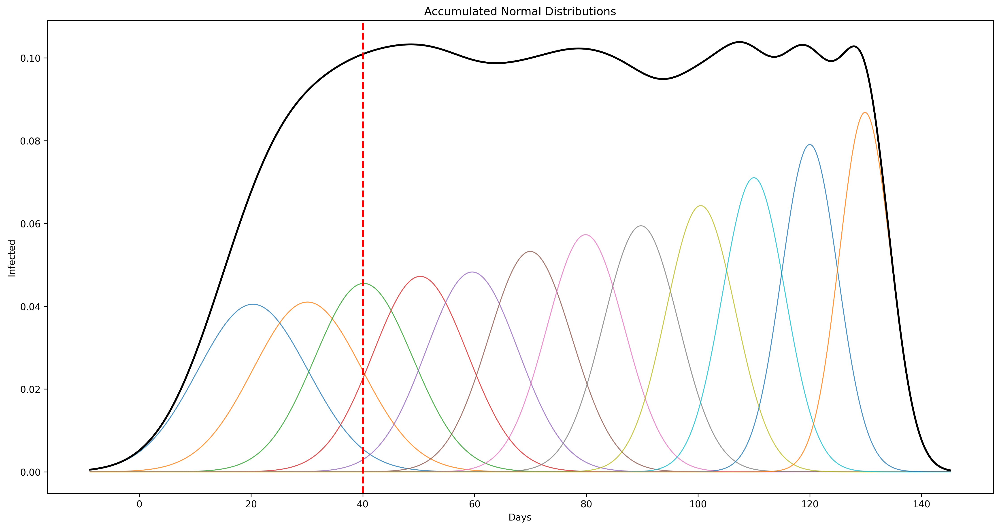

In [87]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

fig, ax1 = plt.subplots(figsize=(15, 8), dpi=300)

# Calculate global min and max for the range of x values
global_min = min(np.min(data) for data in district_data)
global_max = max(np.max(data) for data in district_data)
x_range = np.linspace(global_min, global_max, 1000)

total_pdf = np.zeros_like(x_range)

# Plot PDFs for each district
for i, data in enumerate(district_data):
    mu, sigma = norm.fit(data)
    pdf = norm.pdf(x_range, mu, sigma)
    total_pdf += pdf  # Summing the densities for cumulative line
    ax1.plot(x_range, pdf, linewidth=1, alpha=0.8, label=f'District {i+1} (mu={mu:.2f}, sigma={sigma:.2f})')

# Plot cumulative density
ax1.plot(x_range, total_pdf, 'k-', linewidth=2, label='Total Density')

# Vertical line at x=20
ax1.axvline(x=40, color='red', linestyle='--', linewidth=2, label='Threshold at x=20')

ax1.tick_params(axis='y', labelcolor='black')

plt.xlabel('Days')
plt.ylabel('Infected')
plt.title('Mock data')
plt.title('Accumulated Normal Distributions')

fig.tight_layout()

# Show the plot
plt.show()


In [ ]:
out_file = f'/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/10_{i}_out.csv'


In [ ]:
single_simulation_out
file_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/10__0_out.csv'


In [25]:
compartment_labels=['S', 'E', 'I', 'R', 'VS_1', 'VR_1', 'V_2']
event_labels=['S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']

In [1]:
file_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/10__0_out.csv'


header_names = ['ticks', 'CGB', 'S', 'E', 'I', 'R', 'VS_1', 'VR_1', 'V_2', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']
plot_df = pd.read_csv(file_path, header= None, skiprows = 1, names = header_names)

Events = plot_df[['ticks', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']]
Events = Events.groupby(Events['ticks'] // 2, as_index=False).sum()
Events

NameError: name 'pd' is not defined

In [23]:
compartment_df = pd.read_csv(file_path, header= None, skiprows = 1, names = header_names)

Events = plot_df[['ticks', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']]
Events = Events.groupby(Events['ticks'] // 7, as_index=False).sum()
Events

,ticks,S → E,E → I,I → R,VS_1 → E,VS_1 → V_2,VR_1 → V_2
0,52374,7,0,2,1,0,0
1,174580,3,2,9,0,0,0
2,296786,4,2,7,1,0,0
3,418992,5,2,5,0,2,0
4,541198,4,2,5,0,0,0
...,...,...,...,...,...,...,...
60,7384734,14,11,18,2,1,0
61,7506940,19,22,10,2,0,0
62,7629146,23,21,16,4,0,0
63,7751352,13,25,17,2,0,0


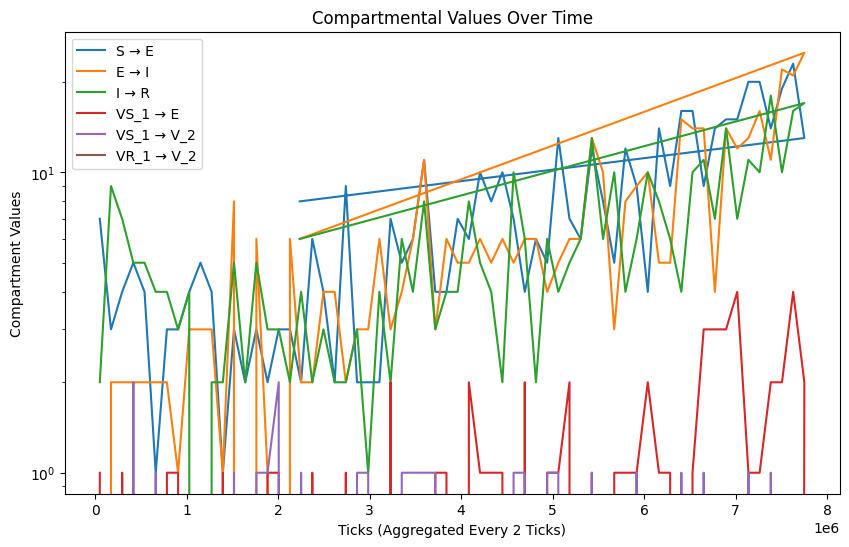

In [26]:
import matplotlib.pyplot as plt

# Assuming MEASLES_IPM is already created and grouped as desired

# Define the compartments to plot
compartments = event_labels

# Setup the plot
plt.figure(figsize=(10, 6))

# Plot each compartment
for compartment in compartments:
    plt.plot(Events['ticks'], Events[compartment], label=compartment)

# Add plot decorations
plt.yscale('log')

plt.title('Compartmental Values Over Time')
plt.xlabel('Ticks (Aggregated Every 2 Ticks)')
plt.ylabel('Compartment Values')
plt.legend()


# Show the plot
plt.show()


In [49]:
compartment_df = pd.read_csv(file_path, header= None, skiprows = 1, names = header_names)
compartment_df

,ticks,CGB,S,E,I,R,VS_1,VR_1,V_2,S → E,E → I,I → R,VS_1 → E,VS_1 → V_2,VR_1 → V_2
0,0,0,26,0,3,0,18,298,0,0,0,0,0,0,0
1,0,1,13,0,0,0,8,132,0,0,0,0,0,0,0
2,0,2,3,2,20,0,0,8,0,2,0,0,0,0,0
3,0,3,8,1,10,1,2,55,0,0,0,1,1,0,0
4,0,4,8,0,0,0,6,99,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1122295,449,2489,61,0,0,4,37,703,0,0,0,0,0,0,0
1122296,449,2490,14,0,0,0,8,152,0,0,0,0,0,0,0
1122297,449,2491,5,0,0,0,3,54,0,0,0,0,0,0,0
1122298,449,2492,88,2,2,1,54,1010,0,0,0,0,0,0,0


In [62]:
compartment_df = pd.read_csv(file_path, header= None, skiprows = 1, names = header_names)

MEASLES_IPM = plot_df[['ticks', 'S', 'E', 'I', 'R', 'VR_1', 'VS_1', 'V_2']]
MEASLES_IPM = MEASLES_IPM.groupby(MEASLES_IPM['ticks']//3, as_index=False).sum().reset_index()
MEASLES_IPM

,index,ticks,S,E,I,R,VR_1,VS_1,V_2
0,0,7482,281805,12,107,4,3034704,163275,0
1,1,29928,281799,18,105,6,3034704,163275,0
2,2,52374,281791,26,100,11,3034704,163275,0
3,3,74820,281787,29,85,27,3034704,163275,0
4,4,97266,281783,29,82,35,3034704,163274,0
...,...,...,...,...,...,...,...,...,...
145,145,3262152,280450,393,197,1046,3034704,163042,75
146,146,3284598,280418,404,198,1071,3034704,163037,75
147,147,3307044,280400,411,197,1088,3034704,163032,75
148,148,3329490,280380,408,198,1111,3034704,163031,75


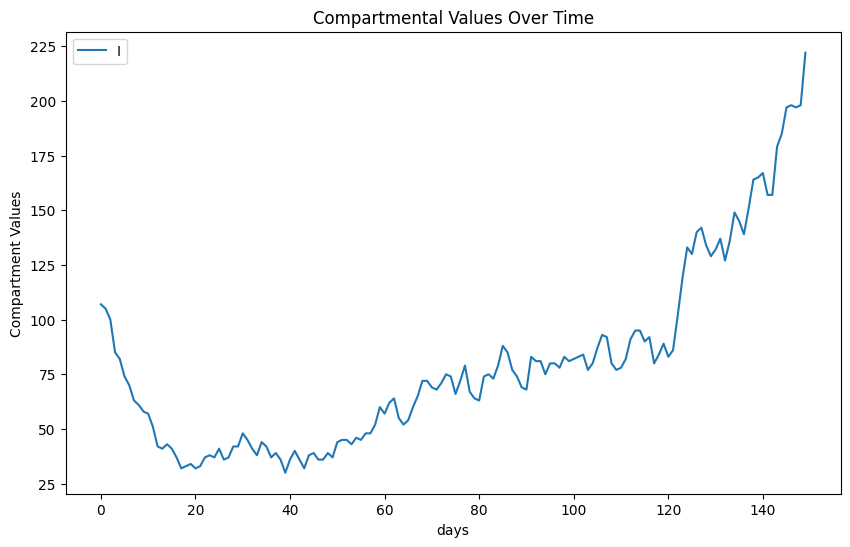

In [64]:
import matplotlib.pyplot as plt

# Assuming MEASLES_IPM is already created and grouped as desired

# Define the compartments to plot
compartments = compartment_labels

# Setup the plot
plt.figure(figsize=(10, 6))

# Plot each compartment
plt.plot(MEASLES_IPM['index'], MEASLES_IPM[compartments[2]], label=compartments[2])    

# Add plot decorations

plt.title('Compartmental Values Over Time')
plt.xlabel('days')
plt.ylabel('Compartment Values')
plt.legend()


# Show the plot
plt.show()


In [ ]:
MEASLES_IPM = MEASLES_IPM.groupby(MEASLES_IPM['ticks'] // 2, as_index=False).sum()

In [ ]:
file_path='/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/10_0_out.csv'
csv_header = ['ticks', 'geo_index', 'S', 'E', 'I', 'R', 'VR_1', 'VS_1', 'V', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']

df = pd.read_csv(file_path, skiprows=1, names=csv_header)
MEASLES_IPM = df[['ticks', 'I']]
    
MEASLES_IPM_grouped = MEASLES_IPM.groupby(MEASLES_IPM['ticks'] // 2, as_index=False).sum()
MEASLES_IPM_grouped

,ticks,I
0,2494,71
1,12470,63
2,22446,60
3,32422,59
4,42398,55
...,...,...
145,1449014,39
146,1458990,42
147,1468966,42
148,1478942,42


In [65]:
model_data = pd.read_csv(file_path, low_memory=False)
model_data

,t,p,c0,c1,c2,c3,c4,c5,c6,e0,e1,e2,e3,e4,e5
0,0,0,29,0,0,0,16,301,0,0,0,0,0,0,0
1,0,1,16,0,0,0,11,151,0,0,0,0,0,0,0
2,0,2,1,0,0,0,2,25,0,0,0,0,0,0,0
3,0,3,5,0,0,0,4,65,0,0,0,0,0,0,0
4,0,4,9,0,0,0,10,117,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1122295,449,2489,65,0,0,0,37,703,0,0,0,0,0,0,0
1122296,449,2490,14,0,0,0,8,152,0,0,0,0,0,0,0
1122297,449,2491,5,0,0,0,3,54,0,0,0,0,0,0,0
1122298,449,2492,93,0,0,0,54,1010,0,0,0,0,0,0,0


In [78]:
model_path = os.path.expanduser('~/Desktop/Github/EpiMoRPH-Modeling/social-determinate-of-health/scratch/output_files/Clustering_algo.csv')
model_data = pd.read_csv(file_path, low_memory=False)
labels = pd.DataFrame(geo_df['label'])

model_column = 'c2'
infected_rate_model_data = model_data[[model_column]]

result_df = []
nodes = 2494

# Create an empty DataFrame to hold the results
model_df = pd.DataFrame()

# Loop to create new DataFrames and concatenate them
for i in range(150 * 3):
    start_idx = i * nodes
    end_idx = (i + 1) * nodes
    result_group = infected_rate_model_data[model_column].iloc[start_idx:end_idx].reset_index(drop=True)
    column_name = f"day {i + 1}"  # Compute column header based on the iteration
    result_group.rename(column_name, inplace=True)
    model_df = pd.concat([model_df, result_group], axis=1)

# Combine every two columns together
combined_df = pd.DataFrame()
for i in range(0, model_df.shape[1], 2):
    combined_column = model_df.iloc[:, i:i+3].sum(axis=1)
    combined_df[f"day {i//3 + 1}"] = combined_column

combined_df_labels = pd.concat([labels, combined_df], axis=1)
combined_df_labels.to_csv(dir + '/infected_compartment.csv')

/var/folders/_v/4q2_l88n1vndy51_ksbfylnc0000gn/T/ipykernel_89666/1278276313.py:27: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  combined_df[f"day {i//3 + 1}"] = combined_column
/var/folders/_v/4q2_l88n1vndy51_ksbfylnc0000gn/T/ipykernel_89666/1278276313.py:27: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  combined_df[f"day {i//3 + 1}"] = combined_column
/var/folders/_v/4q2_l88n1vndy51_ksbfylnc0000gn/T/ipykernel_89666/1278276313.py:27: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `fra

In [79]:
combined_df_labels

,label,day 1,day 2,day 3,day 4,day 5,day 6,day 7,day 8,day 9,...,day 141,day 142,day 143,day 144,day 145,day 146,day 147,day 148,day 149,day 150
0,040130101011,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,040130101012,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,040130101013,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,040130101021,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,040130101022,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2489,040139413001,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,2,0,0,0,0
2490,040139413002,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2491,040139413003,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2492,040139413004,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [83]:

merged_df = pd.merge(census_block_groups, combined_df_labels, left_on='GEOID', right_on='label', how='inner')

gpd_df = gpd.GeoDataFrame(merged_df)



In [ ]:
# Assuming you have 'day 1' to 'day 154' columns in your GeoDataFrame 'gpd_df'
columns_to_animate = ['day ' + str(day) for day in range(1, 154)]

# Create a list to store frames
frames = []

# Temporary directory to store image files
temp_dir = 'temp_images'
os.makedirs(temp_dir, exist_ok=True)

# Loop through the columns and create a frame for each day
v_max_bar = model_data[[model_column]].max()
combined_df.replace([np.inf, -np.inf], np.nan, inplace=True)

# Find the highest finite value in the combined_df DataFrame
highest_value = combined_df.stack().max() - 0.0375
ids = 0
for column in columns_to_animate:
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10), dpi=dpi)

    maricopa_base.plot(ax = ax1, color='gray', edgecolor='black', linewidth = 0.1)
    gpd_df.plot(column=column, cmap='viridis', vmin = 0, 
        vmax = highest_value,legend_kwds={"label": 'Susceptible', "orientation": "vertical"}, legend=True, ax=ax1)
    ax1.set_title(f'Susceptible for day {column[4:]}')  # Set the title for each frame
    ax1.axis('off')  # Turn off the axis

    ax2.plot(sirh_compartment["S"], label='Basis Beta for Node 0', color='blue')
    ax2.plot(ids, sirh_compartment["S"][ids], marker="o", markersize=7, markeredgecolor="red", color='blue')
    ax2.set_title('Susceptible Compartment')
    ax2.set_xlabel('days')
    ax2.set_ylabel('Occurrences')
    ids += 1
    
    # Save the frame as an image in the temporary directory
    img_file = os.path.join(temp_dir, f'day_{column[4:]}.png')
    plt.savefig(img_file, dpi=dpi, bbox_inches='tight')
    plt.close(fig)

    # Open and append the image to the frames list
    frames.append(Image.open(img_file))

# Save frames as a GIF
gif_filename = 'compartments_S_w_timeseries.gif'
frames[0].save(
    gif_filename,
    save_all=True,
    append_images=frames[1:],
    duration=200,  # Time between frames in milliseconds
    loop=0  # 0 means infinite loop
)

# Clean up temporary image files
for img_file in os.listdir(temp_dir):
    file_path = os.path.join(temp_dir, img_file)
    os.remove(file_path)

# Remove the temporary directory
os.rmdir(temp_dir)

print(f'GIF saved as {gif_filename}')

In [87]:
model_data

,t,p,c0,c1,c2,c3,c4,c5,c6,e0,e1,e2,e3,e4,e5
0,0,0,29,0,0,0,16,301,0,0,0,0,0,0,0
1,0,1,16,0,0,0,11,151,0,0,0,0,0,0,0
2,0,2,1,0,0,0,2,25,0,0,0,0,0,0,0
3,0,3,5,0,0,0,4,65,0,0,0,0,0,0,0
4,0,4,9,0,0,0,10,117,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1122295,449,2489,65,0,0,0,37,703,0,0,0,0,0,0,0
1122296,449,2490,14,0,0,0,8,152,0,0,0,0,0,0,0
1122297,449,2491,5,0,0,0,3,54,0,0,0,0,0,0,0
1122298,449,2492,93,0,0,0,54,1010,0,0,0,0,0,0,0


In [92]:
v_max_bar = model_data[[model_column]].max()
combined_df.replace([np.inf, -np.inf], np.nan, inplace=True)
highest_value = combined_df.stack().max()
highest_value

80

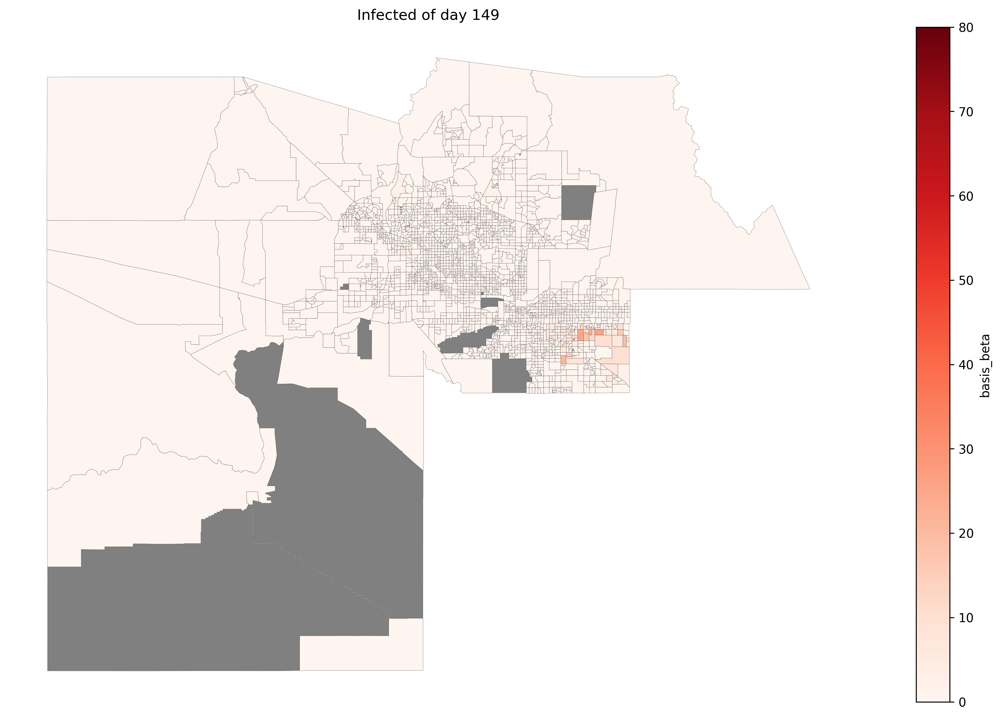

In [107]:
fig, (ax1) = plt.subplots(1, 1, figsize=(20, 10), dpi=dpi)
census_block_groups.plot(ax = ax1, color='gray')
gpd_df.plot(column=column, cmap='Reds', vmin = 0, 
        vmax = highest_value,linewidth = 0.1,  edgecolor='black', legend_kwds={"label": 'basis_beta', "orientation": "vertical"}, legend=True, ax=ax1)
ax1.set_title(f'Infected of day {column[4:]}')  # Set the title for each frame
    
ax1.axis('off') 
plt.show()

In [108]:
from PIL import Image
import os
import matplotlib.pyplot as plt
import geopandas as gpd

dpi = 300
columns_to_animate = ['day ' + str(day) for day in range(1, 150)]

# Create a list to store frames
frames = []

# Temporary directory to store image files
temp_dir = 'temp_images'
os.makedirs(temp_dir, exist_ok=True)

# Loop through the columns and create a frame for each day

ids = 0
for column in columns_to_animate:
    
    fig, (ax1) = plt.subplots(1, 1, figsize=(20, 10), dpi=dpi)

    census_block_groups.plot(ax = ax1, color='gray')
    gpd_df.plot(column=column, cmap='Reds', vmin = 0, 
        vmax = highest_value,linewidth = 0.1,  edgecolor='black',legend_kwds={"label": 'Infected', "orientation": "vertical"}, legend=True, ax=ax1)
    
    ax1.set_title(f'Infected of day {column[4:]}')  # Set the title for each frame
    ax1.axis('off')  

    
    
    # Save the frame as an image in the temporary directory
    img_file = os.path.join(temp_dir, f'day_{column[4:]}.png')
    plt.savefig(img_file, dpi=dpi, bbox_inches='tight')
    plt.close(fig)

    # Open and append the image to the frames list
    frames.append(Image.open(img_file))

# Save frames as a GIF
gif_filename = 'Infected.gif'
frames[0].save(
    gif_filename,
    save_all=True,
    append_images=frames[1:],
    duration=200,  # Time between frames in milliseconds
    loop=0  # 0 means infinite loop
)

# Clean up temporary image files
for img_file in os.listdir(temp_dir):
    file_path = os.path.join(temp_dir, img_file)
    os.remove(file_path)

# Remove the temporary directory
os.rmdir(temp_dir)

print(f'GIF saved as {gif_filename}')


GIF saved as Infected.gif


: 

In [ ]:
import pandas as pd

base_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/'
csv_header = ['ticks', 'geo_index', 'S', 'E', 'I', 'R', 'VR_1', 'VS_1', 'V', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']

# Initialize an empty list to store the pivoted DataFrames for each simulation
pivot_dataframes = []

for i in range(20):
    file_path = f'{base_path}10_{i}_out.csv'
    df = pd.read_csv(file_path, skiprows=1, names=csv_header)
    
    # Calculate the day and select only the last tau tick of each day
    df['day'] = df['ticks'] // 3
    df_last_tau = df[df['ticks'] % 3 == 2]
    
    # Pivot this filtered DataFrame for the 'I' values by geo_index and day
    pivot_df = df_last_tau.pivot(index='geo_index', columns='day', values='I')
    pivot_dataframes.append(pivot_df)

# Concatenate all pivot_dataframes along the columns and provide keys to identify simulations
concatenated_df = pd.concat(pivot_dataframes, axis=1, keys=[f'Sim_{i+1}' for i in range(20)])

# Now, calculate the median across the simulations for each geo_index and day
# Prepare the DataFrame for median calculation
concatenated_df.columns = concatenated_df.columns.map(lambda x: f"{x[0]}_{x[1]}")
median_df = concatenated_df.median(axis=1)

# The median_df now contains the median 'I' values for each geo_index across all days and simulations


In [22]:
concatenated_df

,Sim_1_0,Sim_1_1,Sim_1_2,Sim_1_3,Sim_1_4,Sim_1_5,Sim_1_6,Sim_1_7,Sim_1_8,Sim_1_9,...,Sim_20_90,Sim_20_91,Sim_20_92,Sim_20_93,Sim_20_94,Sim_20_95,Sim_20_96,Sim_20_97,Sim_20_98,Sim_20_99
geo_index,,,,,,,,,,,,,,,,,,,,,
0,4,4,3,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,17,14,13,13,14,11,10,12,10,8,...,7,6,7,7,7,6,8,6,6,6
3,12,12,13,9,8,6,6,6,9,9,...,6,5,5,4,3,4,2,2,2,4
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2489,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2490,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2491,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [32]:
max_days = 150

In [77]:
import pandas as pd
import numpy as np

# Assuming the base_path is defined as in your snippet.
base_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/'
csv_header = ['ticks', 'geo_index', 'S', 'E', 'I', 'R', 'VR_1', 'VS_1', 'V', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']
pivot_dataframes = []  # List to hold the pivoted DataFrame for each simulation

for i in range(20):
    file_path = f'{base_path}10_{i}_communters_out.csv'
    df = pd.read_csv(file_path, skiprows=1, names=csv_header)
    
    # Filter rows to get only the last tau tick of each day
    df['day'] = df['ticks'] // 3  # Calculate the day from ticks
    df_last_tau = df[df['ticks'] % 3 == 2]  # Select only the rows for the last tau tick of each day
    
    # Pivot the DataFrame
    pivot_df = df_last_tau.pivot(index='geo_index', columns='day', values='I')
    pivot_dataframes.append(pivot_df)

full_df = pd.concat(pivot_dataframes, axis=1, keys=range(1, 21))  # Keys are the simulation numbers

# Adjust MultiIndex structure to bring simulation number to the inner level
full_df.columns = full_df.columns.swaplevel(0, 1)
full_df.sort_index(axis=1, inplace=True)

# Calculate the median across the simulation number for each day and node
median_df = full_df.groupby(axis=1, level=0).median()

# Assuming we know the number of days to generate column names accordingly
num_days = 300 // 2  # max_days might need to be defined based on your data
day_columns = [f"day {i}" for i in range(num_days)]
median_df.columns = day_columns
median_df = median_df.reset_index()

# Assuming geo_index of 1 represents node 1 and you're interested in its median values across all days
node_1_median = median_df.loc[1]

/var/folders/_v/4q2_l88n1vndy51_ksbfylnc0000gn/T/ipykernel_93847/2301361048.py:28: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  median_df = full_df.groupby(axis=1, level=0).median()


In [78]:
median_df

,geo_index,day 0,day 1,day 2,day 3,day 4,day 5,day 6,day 7,day 8,...,day 140,day 141,day 142,day 143,day 144,day 145,day 146,day 147,day 148,day 149
0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2489,2489,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2490,2490,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2491,2491,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2492,2492,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [44]:
median_df

,geo_index,day 0,day 1,day 2,day 3,day 4,day 5,day 6,day 7,day 8,...,day 140,day 141,day 142,day 143,day 144,day 145,day 146,day 147,day 148,day 149
0,0,5.0,4.0,4.0,3.0,3.0,3.0,3.0,2.0,2.5,...,6.5,6.5,6.0,5.5,5.0,6.0,6.0,5.5,6.0,5.5
1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,18.0,16.5,16.0,15.0,14.0,14.0,13.0,12.0,12.0,...,2.0,2.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,2.5
3,3,11.0,10.0,9.0,9.0,8.0,8.0,8.0,7.0,8.0,...,3.0,3.0,3.0,3.0,2.5,2.0,3.0,2.5,3.0,2.5
4,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2489,2489,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2490,2490,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2491,2491,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2492,2492,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [45]:
geo_df

,average_household_size,centroid,geoid,label,median_age,median_income,pop_density_km2,population,population_by_age,population_by_age_x6,tract_gini_index,tract_median_income
0,2.33,"[-111.77075643330394, 33.76924660709943]",040130101011,040130101011,50.5,99219,99.319999,358,"[358, 1155, 278]","[358, 110, 671, 374, 194, 84]",0.4423,99489
1,2.15,"[-111.72000671148204, 33.7410933260103]",040130101012,040130101012,63.9,127614,68.782398,162,"[162, 883, 962]","[162, 0, 423, 460, 559, 403]",0.4423,99489
2,1.83,"[-111.66697569766907, 33.72404113568911]",040130101013,040130101013,70.8,80742,183.890869,0,"[0, 271, 993]","[0, 22, 0, 249, 655, 338]",0.4423,99489
3,2.04,"[-111.49136471795472, 33.71546544071483]",040130101021,040130101021,58.9,105987,0.480805,58,"[58, 775, 306]","[58, 52, 361, 362, 258, 48]",0.5439,134865
4,2.20,"[-111.8505100649063, 33.82609833466325]",040130101022,040130101022,62.8,128523,125.420289,110,"[110, 784, 593]","[110, 82, 202, 500, 452, 141]",0.5439,134865
...,...,...,...,...,...,...,...,...,...,...,...,...
2489,4.16,"[-111.87417248956888, 33.51676571547603]",040139413001,040139413001,32.7,38750,54.106432,805,"[805, 1077, 97]","[805, 320, 579, 178, 84, 13]",0.4913,35933
2490,4.15,"[-111.75549278099597, 33.52975077659579]",040139413002,040139413002,33.4,46250,6.065374,174,"[174, 594, 66]","[174, 294, 188, 112, 56, 10]",0.4913,35933
2491,1.87,"[-111.88183665206864, 33.4507490858319]",040139413003,040139413003,64.8,33720,169.206887,62,"[62, 889, 914]","[62, 232, 199, 458, 520, 394]",0.4913,35933
2492,4.29,"[-111.84018577905717, 33.49859253583006]",040139413004,040139413004,26.7,36384,110.898169,1157,"[1157, 1683, 209]","[1157, 735, 609, 339, 172, 37]",0.4913,35933


In [58]:
median_df

,geo_index,day 0,day 1,day 2,day 3,day 4,day 5,day 6,day 7,day 8,...,day 140,day 141,day 142,day 143,day 144,day 145,day 146,day 147,day 148,day 149
0,0,5.0,4.0,4.0,3.0,3.0,3.0,3.0,2.0,2.5,...,6.5,6.5,6.0,5.5,5.0,6.0,6.0,5.5,6.0,5.5
1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,18.0,16.5,16.0,15.0,14.0,14.0,13.0,12.0,12.0,...,2.0,2.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,2.5
3,3,11.0,10.0,9.0,9.0,8.0,8.0,8.0,7.0,8.0,...,3.0,3.0,3.0,3.0,2.5,2.0,3.0,2.5,3.0,2.5
4,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2489,2489,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2490,2490,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2491,2491,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2492,2492,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [53]:
median_df.replace([np.inf, -np.inf], np.nan, inplace=True)
highest_value = median_df.stack().max()
highest_value

2493.0

In [79]:
# Let's simulate a part of the process to create a median_df DataFrame with "day 0" to "day 149" columns
# This is just a simulation and not using your actual data.

import pandas as pd
import numpy as np


day_columns = [f'day {i}' for i in range(149)]  # Create a list of day column names
max_value = median_df[day_columns].max().max()  # This selects only the "day" columns for the max calculation

max_value


31.0

In [ ]:
import numpy as np

def centroids_movement():
    centroid = geo['centroid']
    population = geo['population']
    
    distance = pairwise_haversine(centroid['longitude'], centroid['latitude'])
    
    # Initialize the dispersal kernel with zeros
    dispersal_kernel = np.zeros_like(distance)
    
    # Category fractions for each distance category
    frac_short_distance = [0.2, 0.3, 0.3, 0.2]
    frac_medium_distance = [0.3, 0.2, 0.2, 0.3]
    frac_long_distance = [0.5, 0.5, 0.5, 0.5]
    
    # Category 1: 0-10km
    short_distance_indices = (distance > 0) & (distance <= 10)
    dispersal_kernel[short_distance_indices] = (1 / np.exp(distance[short_distance_indices] / params['phi'])) * frac_short_distance
    
    # Category 2: [10, 100)km
    medium_distance_indices = (distance > 10) & (distance < 100)
    dispersal_kernel[medium_distance_indices] = (0.1 / np.exp(distance[medium_distance_indices] / (2 * params['phi']))) * frac_medium_distance  # Adjusted for medium distances
    
    # Category 3: 100+km
    long_distance_indices = distance >= 100
    # Assuming a constant, but much lower, value for these distances
    dispersal_kernel[long_distance_indices] = 0.01 * frac_long_distance  # This is an example value, indicating very low but non-zero movement probability
    
    # Normalize the rows of the dispersal kernel to ensure they sum to 1,
    # but only for rows where there is at least one non-zero value
    row_sums = dispersal_kernel.sum(axis=1, keepdims=True)
    non_zero_rows = row_sums > 0
    dispersal_kernel[non_zero_rows] = dispersal_kernel[non_zero_rows] / row_sums[non_zero_rows]
    
    return {'dispersal_kernel': dispersal_kernel}





In [80]:
from PIL import Image
import os
import matplotlib.pyplot as plt
import geopandas as gpd

sim_data_df = [median_df, geo_df] 

sim_df = pd.concat(sim_data_df, axis =1)

merged_df = pd.merge(census_block_groups, sim_df, left_on='GEOID', right_on='label', how='inner')

gpd_df = gpd.GeoDataFrame(merged_df)

dpi = 300
columns_to_animate = ['day ' + str(day) for day in range(1, 150)]


# Create a list to store frames
frames = []

# Temporary directory to store image files
temp_dir = 'temp_images'
os.makedirs(temp_dir, exist_ok=True)

# Loop through the columns and create a frame for each day

ids = 0
for column in columns_to_animate:
    
    fig, (ax1) = plt.subplots(1, 1, figsize=(20, 10), dpi=dpi)

    census_block_groups.plot(ax = ax1, color='gray')
    gpd_df.plot(column=column, cmap='Reds', vmin = 0, 
        vmax = max_value,linewidth = 0.1,  edgecolor='black',legend_kwds={"label": 'Infected', "orientation": "vertical"}, legend=True, ax=ax1)
    
    ax1.set_title(f'Infected of day {column[4:]}')  # Set the title for each frame
    ax1.axis('off')  

    
    
    # Save the frame as an image in the temporary directory
    img_file = os.path.join(temp_dir, f'day_{column[4:]}.png')
    plt.savefig(img_file, dpi=dpi, bbox_inches='tight')
    plt.close(fig)

    # Open and append the image to the frames list
    frames.append(Image.open(img_file))

# Save frames as a GIF
gif_filename = 'Median Infected.gif'
frames[0].save(
    gif_filename,
    save_all=True,
    append_images=frames[1:],
    duration=200,  # Time between frames in milliseconds
    loop=0  # 0 means infinite loop
)

# Clean up temporary image files
for img_file in os.listdir(temp_dir):
    file_path = os.path.join(temp_dir, img_file)
    os.remove(file_path)

# Remove the temporary directory
os.rmdir(temp_dir)

print(f'GIF saved as {gif_filename}')

GIF saved as Median Infected.gif


In [ ]:
10_19_communters_out

In [4]:
import pandas as pd

base_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Simulation_runs/'
dataframe = pd.DataFrame()
csv_header = ['ticks', 'geo_index', 'S', 'E', 'I', 'R', 'VR_1', 'VS_1', 'V', 'S → E', 'E → I', 'I → R', 'VS_1 → E', 'VS_1 → V_2', 'VR_1 → V_2']

max_days = 0

for i in range(20):
    file_path = f'{base_path}10_{i}_communters_out.csv'
    
    df = pd.read_csv(file_path, skiprows=1, names=csv_header)
    
    MEASLES_IPM = df[['ticks', 'I']]
    
    MEASLES_IPM_grouped = MEASLES_IPM.groupby(MEASLES_IPM['ticks'], as_index=False).sum()
    
    if MEASLES_IPM_grouped.shape[0] > max_days:
        max_days = MEASLES_IPM_grouped.shape[0]
    
    dataframe[f'Sim_{i+1}'] = MEASLES_IPM_grouped['I'].reindex(range(max_days)).values

dataframe.index = range(max_days)
dataframe


,Sim_1,Sim_2,Sim_3,Sim_4,Sim_5,Sim_6,Sim_7,Sim_8,Sim_9,Sim_10,Sim_11,Sim_12,Sim_13,Sim_14,Sim_15,Sim_16,Sim_17,Sim_18,Sim_19,Sim_20
0,1,1,0,4,4,4,4,3,4,3,3,4,4,4,4,4,4,3,4,4
1,1,1,0,4,4,4,4,3,4,3,3,4,4,4,4,4,4,2,3,4
2,1,1,0,4,4,4,4,3,4,3,3,3,4,4,4,4,4,1,3,4
3,1,1,0,4,4,4,4,3,4,3,2,3,4,4,4,4,4,1,3,3
4,1,1,0,4,4,4,4,3,4,3,2,3,4,4,4,4,4,1,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
751,55,0,0,252,294,531,196,79,463,76,210,292,68,139,282,101,156,152,0,0
752,50,0,0,253,299,533,191,81,459,76,210,301,67,142,292,99,153,154,0,0
753,49,0,0,257,299,537,197,82,460,75,205,301,68,142,295,97,156,153,0,0
754,49,0,0,260,302,547,194,84,470,76,202,301,68,142,298,97,157,153,0,0


In [27]:
MEASLES_IPM_grouped

,ticks,I
0,0,60
1,1,56
2,2,55
3,3,54
4,4,53
...,...,...
295,295,279
296,296,277
297,297,277
298,298,287


In [23]:
filtered_df = df[df['ticks'] == 0]

# Finding the maximum value of 'I' within the filtered DataFrame
max_I = filtered_df['I'].max()

max_I

27

In [29]:
filtered_df = df[df['ticks'] == 2]

# Finding the maximum value of 'I' within the filtered DataFrame
max_I = filtered_df['I'].sum()

max_I

55

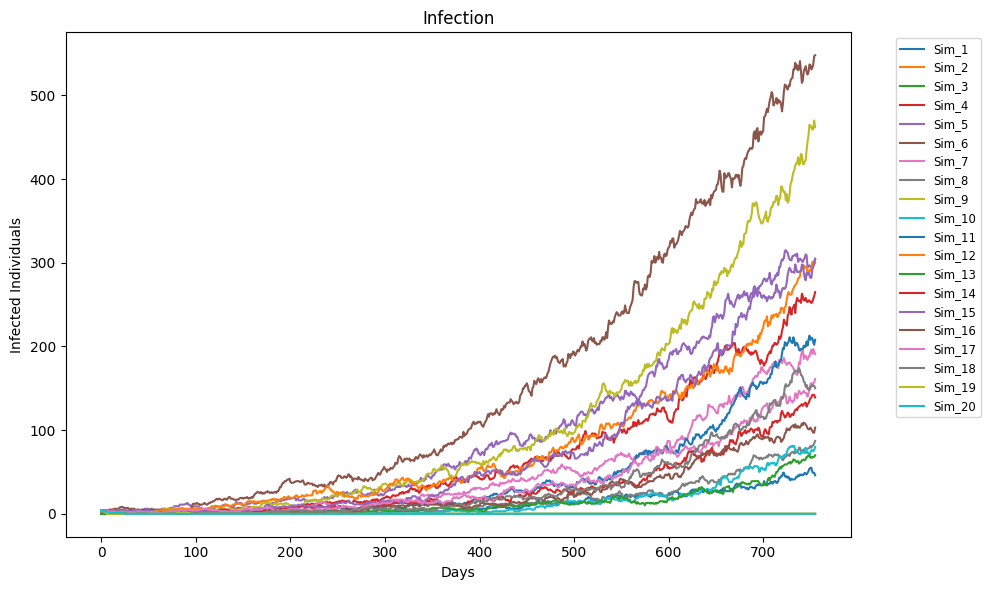

In [15]:
plt.figure(figsize=(10, 6))

for column in dataframe.columns:
    plt.plot(dataframe[column], label=column)

plt.xlabel('Days')
plt.ylabel('Infected Individuals')
plt.title('Infection')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
plt.tight_layout()

plt.show()

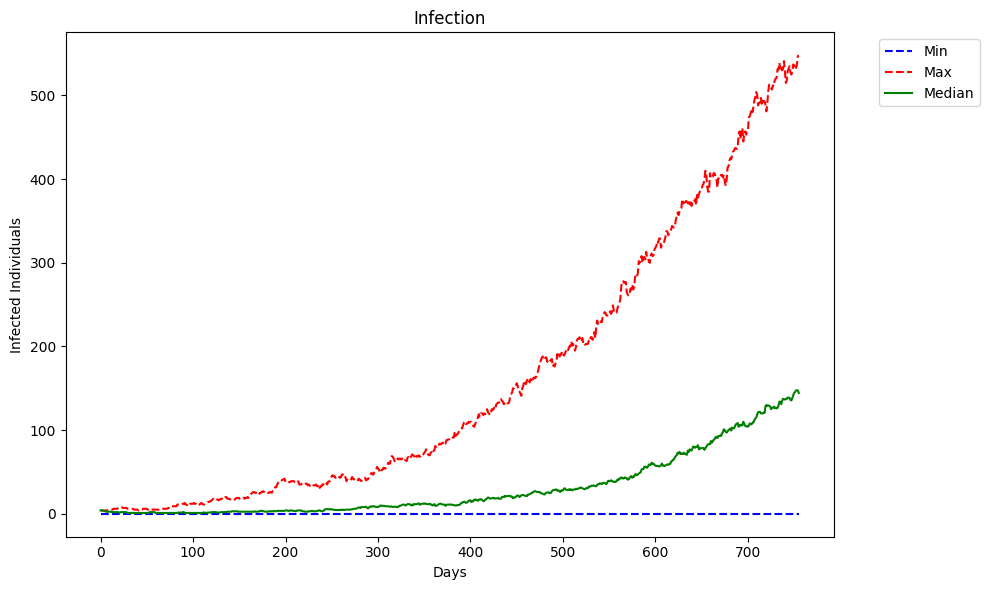

In [16]:
min_values = dataframe.min(axis=1)
max_values = dataframe.max(axis=1)
median_values = dataframe.median(axis=1)

plt.figure(figsize=(10, 6))

plt.plot(min_values, label='Min', linestyle='--', color='blue')
plt.plot(max_values, label='Max', linestyle='--', color='red')
plt.plot(median_values, label='Median', linestyle='-', color='green')

plt.xlabel('Days')
plt.ylabel('Infected Individuals')
plt.title('Infection')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

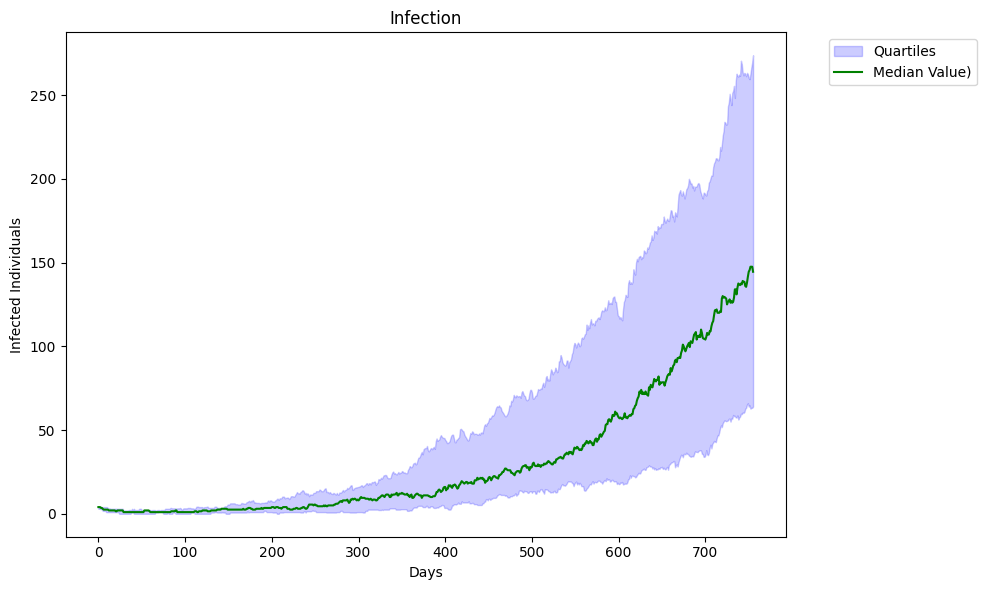

In [17]:
first_quartile = dataframe.quantile(0.25, axis=1)
third_quartile = dataframe.quantile(0.75, axis=1)
median_values = dataframe.median(axis=1)

plt.figure(figsize=(10, 6))

plt.fill_between(range(len(first_quartile)), first_quartile, third_quartile, color='blue', alpha=0.2, label='Quartiles')

plt.plot(median_values, label='Median Value)', color='green', linestyle='-')

plt.xlabel('Days')
plt.ylabel('Infected Individuals')
plt.title('Infection')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


# Centroid Movement


In [ ]:
def haversine(centroid_1_lon: float, centroid_1_lat: float,
              centroid_2_lon: float, centroid_2_lat: float) -> np.double:
    R = 3959.87433
    dLat = np.radians(centroid_1_lat - centroid_2_lat)
    dLon = np.radians(centroid_1_lon - centroid_2_lon)
    lat1 = np.radians(centroid_1_lat)
    lat2 = np.radians(centroid_2_lat)

    a = np.sin(dLat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dLon/2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    
    return R * c

In [ ]:
from typing import (Any, Callable, Generator, Generic, Iterable, Literal,
                    OrderedDict, TypeVar)

In [ ]:
from numpy.typing import DTypeLike, NDArray
N = TypeVar('N', bound=np.number)

NDIndices = NDArray[np.intp]


In [ ]:
def row_normalize(arr: NDArray[N], row_sums: NDArray[N] | None = None, dtype: DTypeLike = None) -> NDArray[N]:
    """
    Assuming `arr` is a 2D array, normalize values across each row by dividing by the row sum.
    If you've already calculated row sums, you can pass those in, otherwise they will be computed.
    """
    if row_sums is None:
        row_sums = arr.sum(axis=1, dtype=dtype)
    # We do a maximum(1, ...) here to protect against div-by-zero:
    # if we assume `arr` is strictly non-negative and if a row-sum is zero,
    # then every entry in the row is zero therefore dividing by 1 is fine.
    return arr / np.maximum(1, row_sums[:, np.newaxis])  # type: ignore
    # numpy's types are garbage


RADIUS_MI = 3959.87433  # radius of earth in mi


def pairwise_haversine(longitudes: NDArray[np.float64], latitudes: NDArray[np.float64]) -> NDArray[np.float64]:
    """Compute the distances in miles between all pairs of coordinates."""
    # https://www.themathdoctors.org/distances-on-earth-2-the-haversine-formula
    lng = np.radians(longitudes)
    lat = np.radians(latitudes)
    dlng = lng[:, np.newaxis] - lng[np.newaxis, :]
    dlat = lat[:, np.newaxis] - lat[np.newaxis, :]
    cos_lat = np.cos(lat)

    a = np.sin(dlat / 2.0) ** 2 \
        + (cos_lat[:, np.newaxis] * cos_lat[np.newaxis, :]) \
        * np.sin(dlng / 2.0) ** 2
    return 2 * RADIUS_MI * np.arcsin(np.sqrt(a))


In [ ]:

def centroids_movement():
    centroid = geo['centroid']
    distance = pairwise_haversine(centroid['longitude'], centroid['latitude'])
    dispersal_kernel = row_normalize(1 / np.exp(distance / params['phi']))
    return { 'dispersal_kernel': dispersal_kernel }



In [ ]:
dir = os.path.expanduser('~/Desktop/Github/EpiMoRPH-Modeling/social-determinate-of-health/scratch/Movement_model')


In [ ]:
geo_df

,average_household_size,centroid,geoid,label,median_age,median_income,pop_density_km2,population,population_by_age,population_by_age_x6,tract_gini_index,tract_median_income
0,2.33,"[-111.77075643330394, 33.76924660709943]",040130101011,040130101011,50.5,99219,99.319999,1791,"[358, 1155, 278]","[358, 110, 671, 374, 194, 84]",0.4423,99489
1,2.15,"[-111.72000671148204, 33.7410933260103]",040130101012,040130101012,63.9,127614,68.782398,2007,"[162, 883, 962]","[162, 0, 423, 460, 559, 403]",0.4423,99489
2,1.83,"[-111.66697569766907, 33.72404113568911]",040130101013,040130101013,70.8,80742,183.890869,1264,"[0, 271, 993]","[0, 22, 0, 249, 655, 338]",0.4423,99489
3,2.04,"[-111.49136471795472, 33.71546544071483]",040130101021,040130101021,58.9,105987,0.480805,1139,"[58, 775, 306]","[58, 52, 361, 362, 258, 48]",0.5439,134865
4,2.20,"[-111.8505100649063, 33.82609833466325]",040130101022,040130101022,62.8,128523,125.420289,1487,"[110, 784, 593]","[110, 82, 202, 500, 452, 141]",0.5439,134865
...,...,...,...,...,...,...,...,...,...,...,...,...
2489,4.16,"[-111.87417248956888, 33.51676571547603]",040139413001,040139413001,32.7,38750,54.106432,1979,"[805, 1077, 97]","[805, 320, 579, 178, 84, 13]",0.4913,35933
2490,4.15,"[-111.75549278099597, 33.52975077659579]",040139413002,040139413002,33.4,46250,6.065374,834,"[174, 594, 66]","[174, 294, 188, 112, 56, 10]",0.4913,35933
2491,1.87,"[-111.88183665206864, 33.4507490858319]",040139413003,040139413003,64.8,33720,169.206887,1865,"[62, 889, 914]","[62, 232, 199, 458, 520, 394]",0.4913,35933
2492,4.29,"[-111.84018577905717, 33.49859253583006]",040139413004,040139413004,26.7,36384,110.898169,3049,"[1157, 1683, 209]","[1157, 735, 609, 339, 172, 37]",0.4913,35933


In [ ]:
census_block_groups

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,04,013,421702,3,040134217023,Block Group 3,G5030,S,310375,0,+33.4123043,-111.7788867,"POLYGON ((427100.723 3697614.906, 427237.685 3..."
1,04,013,040531,2,040130405312,Block Group 2,G5030,S,616061,0,+33.6422660,-112.3722104,"POLYGON ((372323.452 3723522.221, 372331.103 3..."
2,04,013,092312,1,040130923121,Block Group 1,G5030,S,295623,0,+33.5654583,-112.1989360,"POLYGON ((388347.235 3714764.666, 388348.079 3..."
5,04,013,092721,1,040130927211,Block Group 1,G5030,S,1108648,0,+33.5408739,-112.2472748,"POLYGON ((383469.255 3711596.776, 383469.334 3..."
6,04,013,093104,1,040130931041,Block Group 1,G5030,S,168697,0,+33.5113085,-112.1797305,"POLYGON ((390223.962 3708403.396, 390225.485 3..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4139,04,013,811900,2,040138119002,Block Group 2,G5030,S,771839,0,+33.2801026,-111.8638617,"POLYGON ((418884.826 3683057.566, 418958.788 3..."
4140,04,013,812000,1,040138120001,Block Group 1,G5030,S,1279036,0,+33.2802159,-111.8501034,"POLYGON ((420043.154 3683071.365, 420060.468 3..."
4141,04,013,812000,2,040138120002,Block Group 2,G5030,S,1360898,0,+33.2876864,-111.8502128,"POLYGON ((420033.499 3683935.182, 420063.570 3..."
4176,04,013,523002,3,040135230023,Block Group 3,G5030,S,666349,0,+33.3097028,-111.8546715,"POLYGON ((420024.315 3685692.562, 420027.174 3..."


In [ ]:
import pandas as pd

# Assuming census_block_groups is your existing DataFrame
# Ensure the latitude and longitude columns are in float format
census_block_groups['INTPTLAT'] = pd.to_numeric(census_block_groups['INTPTLAT'], errors='coerce')
census_block_groups['INTPTLON'] = pd.to_numeric(census_block_groups['INTPTLON'], errors='coerce')

# Create the 'centroid' column by combining 'INTPTLON' and 'INTPTLAT' into a tuple
census_block_groups['centroid'] = census_block_groups.apply(lambda row: (row['INTPTLON'], row['INTPTLAT']), axis=1)

# Now, census_block_groups has a new column 'centroid' with the desired tuple format
census_block_groups

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,centroid
0,04,013,421702,3,040134217023,Block Group 3,G5030,S,310375,0,33.412304,-111.778887,"POLYGON ((-111.78406 33.41540, -111.78259 33.4...","(-111.7788867, 33.4123043)"
1,04,013,040531,2,040130405312,Block Group 2,G5030,S,616061,0,33.642266,-112.372210,"POLYGON ((-112.37679 33.64389, -112.37673 33.6...","(-112.3722104, 33.642266)"
2,04,013,092312,1,040130923121,Block Group 1,G5030,S,295623,0,33.565458,-112.198936,"POLYGON ((-112.20294 33.56672, -112.20293 33.5...","(-112.198936, 33.5654583)"
5,04,013,092721,1,040130927211,Block Group 1,G5030,S,1108648,0,33.540874,-112.247275,"POLYGON ((-112.25507 33.53763, -112.25507 33.5...","(-112.2472748, 33.5408739)"
6,04,013,093104,1,040130931041,Block Group 1,G5030,S,168697,0,33.511308,-112.179731,"POLYGON ((-112.18194 33.50955, -112.18193 33.5...","(-112.1797305, 33.5113085)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4139,04,013,811900,2,040138119002,Block Group 2,G5030,S,771839,0,33.280103,-111.863862,"POLYGON ((-111.87111 33.28352, -111.87031 33.2...","(-111.8638617, 33.2801026)"
4140,04,013,812000,1,040138120001,Block Group 1,G5030,S,1279036,0,33.280216,-111.850103,"POLYGON ((-111.85867 33.28374, -111.85848 33.2...","(-111.8501034, 33.2802159)"
4141,04,013,812000,2,040138120002,Block Group 2,G5030,S,1360898,0,33.287686,-111.850213,"POLYGON ((-111.85885 33.29153, -111.85853 33.2...","(-111.8502128, 33.2876864)"
4176,04,013,523002,3,040135230023,Block Group 3,G5030,S,666349,0,33.309703,-111.854671,"POLYGON ((-111.85910 33.30737, -111.85908 33.3...","(-111.8546715, 33.3097028)"


In [ ]:
census_block_groups['centroid'][1]

(-112.3722104, 33.642266)

In [ ]:
census_block_groups.reset_index(drop=True, inplace=True)


In [ ]:
num_labels = len(census_block_groups['GEOID'])
distances = np.zeros((num_labels, num_labels))
phi_values = np.zeros((num_labels, num_labels))
phi_0 = 0.10
for i in range(num_labels):
    for j in range(num_labels):
        if i != j:
            # Accessing centroid values safely
            centroid_i = census_block_groups.at[i, 'centroid']
            centroid_j = census_block_groups.at[j, 'centroid']
            distances[i, j] = haversine(centroid_i[0], centroid_i[1], centroid_j[0], centroid_j[1])


In [ ]:
num_labels = len(geo_df['GEOID'])
distances = np.zeros((num_labels, num_labels))
phi_values = np.zeros((num_labels, num_labels))
phi_0 = 0.10

# Calculate distances
for i in range(num_labels):
    for j in range(num_labels):
        if i != j:
            distances[i, j] = haversine(geo_df['centroid'][i][0], geo_df['centroid'][i][1],
                                       geo_df['centroid'][j][0], geo_df['centroid'][j][1])

KeyError: 3

In [ ]:
# Calculate phi values
phi_10 = 1 / np.exp(distances * (1/10))
phi_20 = 1 / np.exp(distances * (1/20))
phi_30 = 1 / np.exp(distances * (1/30))
phi_40 = 1 / np.exp(distances * (1/40))
phi_50 = 1 / np.exp(distances * (1/50))

# Save phi and distances as CSV
phi_10_df = pd.DataFrame(phi_10)
phi_20_df = pd.DataFrame(phi_20)
phi_30_df = pd.DataFrame(phi_30)
phi_40_df = pd.DataFrame(phi_40)
phi_50_df = pd.DataFrame(phi_50)
dist_df = pd.DataFrame(distances)
p_cbg = 540
cgb_d = dist_df.iloc[:, p_cbg]
cgb_10 = phi_10_df.iloc[:, p_cbg]
cgb_20 = phi_20_df.iloc[:, p_cbg]
cgb_30 = phi_30_df.iloc[:, p_cbg]
cgb_40 = phi_40_df.iloc[:, p_cbg]
cgb_50 = phi_50_df.iloc[:, p_cbg]

cgb = pd.concat([cgb_d, cgb_10, cgb_20, cgb_30, cgb_40, cgb_50], axis=1)

cgb.columns = ["distance", "phi 10", "phi 20", "phi 30", "phi 40", "phi 50"]
cgb

,distance,phi 10,phi 20,phi 30,phi 40,phi 50
0,43.618281,0.012755,0.112938,0.233647,0.336063,0.417962
1,22.087580,0.109837,0.331417,0.478905,0.575688,0.642909
2,10.734893,0.341814,0.584648,0.699192,0.764623,0.806785
3,7.233647,0.485117,0.696504,0.785746,0.834568,0.865305
4,7.005189,0.496328,0.704505,0.791753,0.839348,0.869268
...,...,...,...,...,...,...
2500,41.384910,0.015947,0.126281,0.251705,0.355360,0.437054
2501,42.470681,0.014306,0.119608,0.242758,0.345844,0.427666
2502,42.039747,0.014936,0.122213,0.246270,0.349590,0.431367
2503,40.499579,0.017423,0.131997,0.259244,0.363313,0.444862


In [ ]:
sim_data_df = [census_block_groups,cgb] 
sim_df = pd.concat(sim_data_df, axis =1)

gpd_df = gpd.GeoDataFrame(sim_df)
gpd_df

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,centroid,distance,phi 10,phi 20,phi 30,phi 40,phi 50
0,04,013,421702,3,040134217023,Block Group 3,G5030,S,310375,0,33.412304,-111.778887,"POLYGON ((-111.78406 33.41540, -111.78259 33.4...","(-111.7788867, 33.4123043)",43.618281,0.012755,0.112938,0.233647,0.336063,0.417962
1,04,013,040531,2,040130405312,Block Group 2,G5030,S,616061,0,33.642266,-112.372210,"POLYGON ((-112.37679 33.64389, -112.37673 33.6...","(-112.3722104, 33.642266)",22.087580,0.109837,0.331417,0.478905,0.575688,0.642909
2,04,013,092312,1,040130923121,Block Group 1,G5030,S,295623,0,33.565458,-112.198936,"POLYGON ((-112.20294 33.56672, -112.20293 33.5...","(-112.198936, 33.5654583)",10.734893,0.341814,0.584648,0.699192,0.764623,0.806785
3,04,013,092721,1,040130927211,Block Group 1,G5030,S,1108648,0,33.540874,-112.247275,"POLYGON ((-112.25507 33.53763, -112.25507 33.5...","(-112.2472748, 33.5408739)",7.233647,0.485117,0.696504,0.785746,0.834568,0.865305
4,04,013,093104,1,040130931041,Block Group 1,G5030,S,168697,0,33.511308,-112.179731,"POLYGON ((-112.18194 33.50955, -112.18193 33.5...","(-112.1797305, 33.5113085)",7.005189,0.496328,0.704505,0.791753,0.839348,0.869268
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2500,04,013,811900,2,040138119002,Block Group 2,G5030,S,771839,0,33.280103,-111.863862,"POLYGON ((-111.87111 33.28352, -111.87031 33.2...","(-111.8638617, 33.2801026)",41.384910,0.015947,0.126281,0.251705,0.355360,0.437054
2501,04,013,812000,1,040138120001,Block Group 1,G5030,S,1279036,0,33.280216,-111.850103,"POLYGON ((-111.85867 33.28374, -111.85848 33.2...","(-111.8501034, 33.2802159)",42.470681,0.014306,0.119608,0.242758,0.345844,0.427666
2502,04,013,812000,2,040138120002,Block Group 2,G5030,S,1360898,0,33.287686,-111.850213,"POLYGON ((-111.85885 33.29153, -111.85853 33.2...","(-111.8502128, 33.2876864)",42.039747,0.014936,0.122213,0.246270,0.349590,0.431367
2503,04,013,523002,3,040135230023,Block Group 3,G5030,S,666349,0,33.309703,-111.854671,"POLYGON ((-111.85910 33.30737, -111.85908 33.3...","(-111.8546715, 33.3097028)",40.499579,0.017423,0.131997,0.259244,0.363313,0.444862


In [ ]:
sim_data_df = [census_block_groups,cgb] 
sim_df = pd.concat(sim_data_df, axis =1)

gpd_df = gpd.GeoDataFrame(sim_df)
gpd_df

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,centroid,distance,phi 10,phi 20,phi 30,phi 40,phi 50
0,04,013,421702,3,040134217023,Block Group 3,G5030,S,310375,0,33.412304,-111.778887,"POLYGON ((427100.723 3697614.906, 427237.685 3...","(-111.7788867, 33.4123043)",27.080452,0.066667,0.258200,0.405481,0.508133,0.581811
1,04,013,040531,2,040130405312,Block Group 2,G5030,S,616061,0,33.642266,-112.372210,"POLYGON ((372323.452 3723522.221, 372331.103 3...","(-112.3722104, 33.642266)",13.713095,0.253774,0.503760,0.633115,0.709761,0.760133
2,04,013,092312,1,040130923121,Block Group 1,G5030,S,295623,0,33.565458,-112.198936,"POLYGON ((388347.235 3714764.666, 388348.079 3...","(-112.198936, 33.5654583)",6.664768,0.513515,0.716599,0.800788,0.846522,0.875207
3,04,013,092721,1,040130927211,Block Group 1,G5030,S,1108648,0,33.540874,-112.247275,"POLYGON ((383469.255 3711596.776, 383469.334 3...","(-112.2472748, 33.5408739)",4.491017,0.638201,0.798875,0.860966,0.893798,0.914095
4,04,013,093104,1,040130931041,Block Group 1,G5030,S,168697,0,33.511308,-112.179731,"POLYGON ((390223.962 3708403.396, 390225.485 3...","(-112.1797305, 33.5113085)",4.349178,0.647318,0.804561,0.865046,0.896973,0.916692
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2500,04,013,811900,2,040138119002,Block Group 2,G5030,S,771839,0,33.280103,-111.863862,"POLYGON ((418884.826 3683057.566, 418958.788 3...","(-111.8638617, 33.2801026)",25.693861,0.076583,0.276736,0.424662,0.526057,0.598172
2501,04,013,812000,1,040138120001,Block Group 1,G5030,S,1279036,0,33.280216,-111.850103,"POLYGON ((420043.154 3683071.365, 420060.468 3...","(-111.8501034, 33.2802159)",26.367963,0.071590,0.267564,0.415226,0.517265,0.590161
2502,04,013,812000,2,040138120002,Block Group 2,G5030,S,1360898,0,33.287686,-111.850213,"POLYGON ((420033.499 3683935.182, 420063.570 3...","(-111.8502128, 33.2876864)",26.100417,0.073531,0.271167,0.418946,0.520737,0.593328
2503,04,013,523002,3,040135230023,Block Group 3,G5030,S,666349,0,33.309703,-111.854671,"POLYGON ((420024.315 3685692.562, 420027.174 3...","(-111.8546715, 33.3097028)",25.144202,0.080910,0.284446,0.432514,0.533335,0.604784


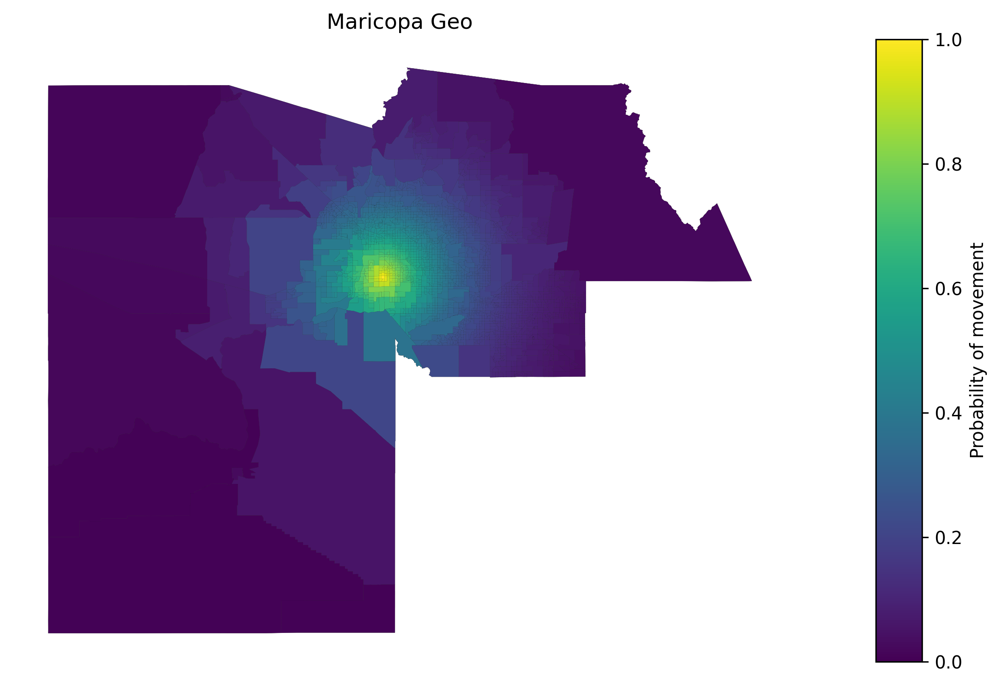

In [ ]:
# Create the figure and axes
from mpl_toolkits.axes_grid1 import make_axes_locatable

fig, ax = plt.subplots(figsize=(10, 10), dpi=300)

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)


# Plot the map
census_block_groups.plot(
    ax=ax,
    edgecolor='black',
    color='grey',
    linewidth=0.1
)

gpd_df.plot(
    ax=ax,
    edgecolor='black',
    column='phi 20',
    legend=True,
    cmap='viridis', 
    vmin=0,
    vmax=1,
    linewidth=0.005,
    cax=cax,
    legend_kwds={"label": 'Probability of movement', "orientation": "vertical"},
)

# Set the title
ax.set_title('Maricopa Geo')
ax.axis('off')
# Saves map

# Show the plot
plt.show()

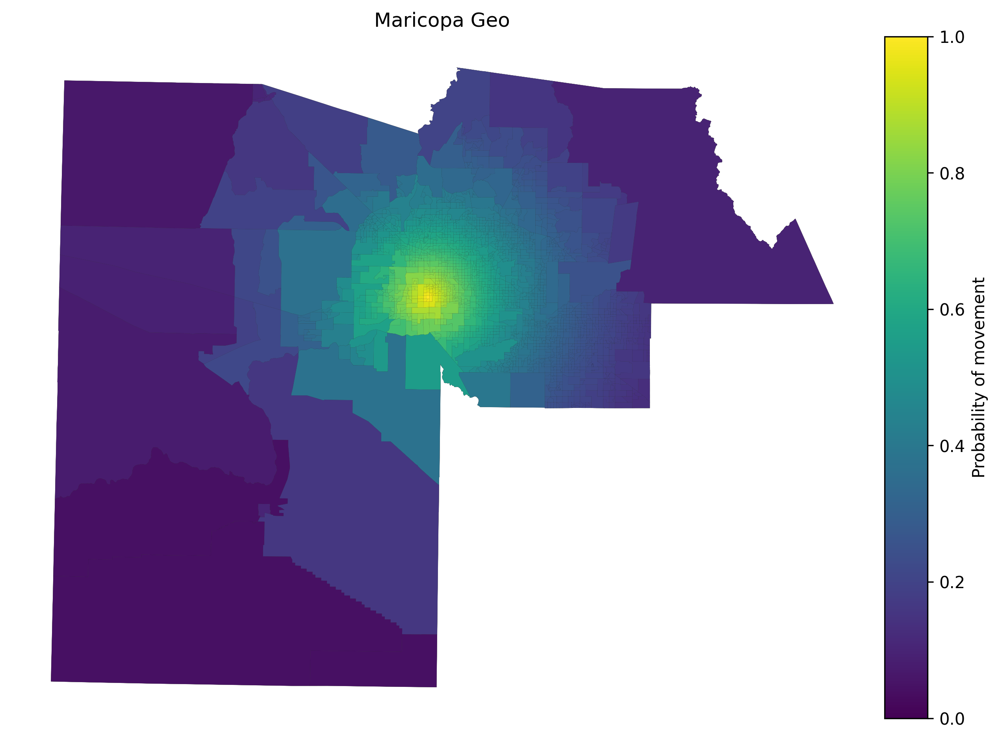

In [ ]:
# Create the figure and axes
from mpl_toolkits.axes_grid1 import make_axes_locatable

fig, ax = plt.subplots(figsize=(10, 10), dpi=300)

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)


# Plot the map
census_block_groups.plot(
    ax=ax,
    edgecolor='black',
    color='grey',
    linewidth=0.1
)

gpd_df.plot(
    ax=ax,
    edgecolor='black',
    column='phi 20',
    legend=True,
    cmap='viridis', 
    vmin=0,
    vmax=1,
    linewidth=0.005,
    cax=cax,
    legend_kwds={"label": 'Probability of movement', "orientation": "vertical"},
)

# Set the title
ax.set_title('Maricopa Geo')
ax.axis('off')
# Saves map

# Show the plot
plt.show()

In [ ]:
min(phi)

' '

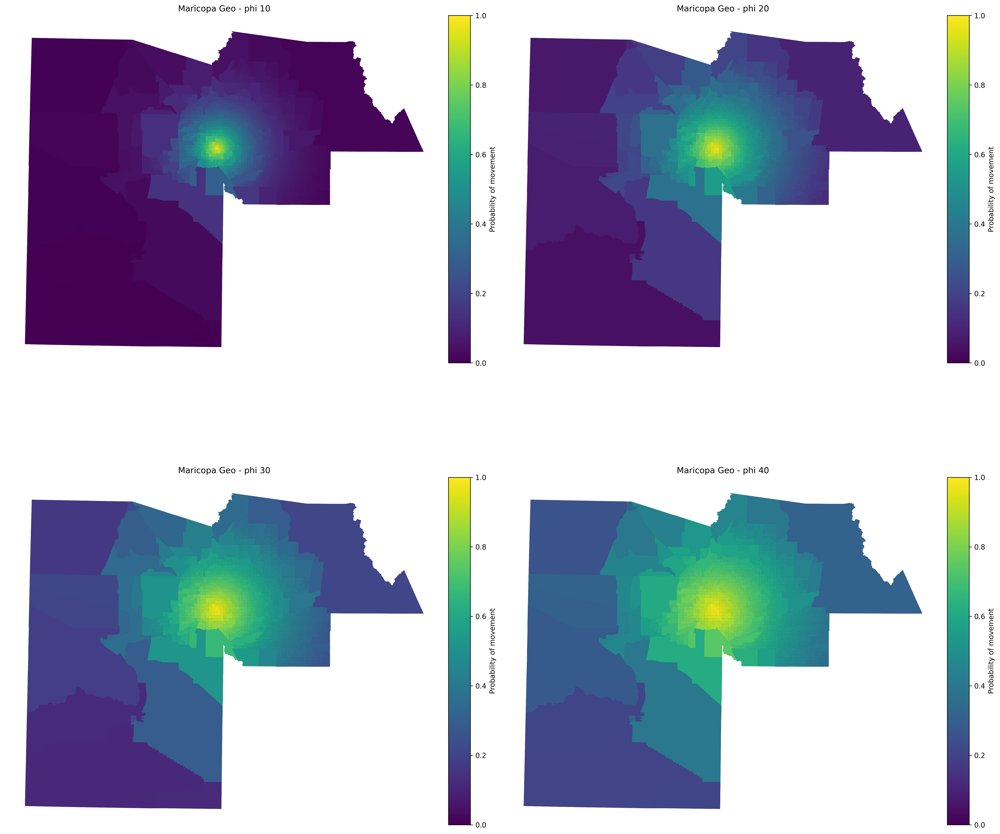

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Assuming 'census_block_groups' and 'gpd_df' are your GeoPandas dataframes
# and they are already loaded and ready to use.

# Create the figure and GridSpec layout
fig = plt.figure(figsize=(20, 20), dpi=300)
gs = gridspec.GridSpec(2, 2, figure=fig)

# Define phi values
phi_values = ['phi 10', 'phi 20', 'phi 30', 'phi 40']

# Loop through phi values and plot each one in its own subplot
for i, phi in enumerate(phi_values):
    ax = fig.add_subplot(gs[i // 2, i % 2])
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)

    # Plot the base map
    census_block_groups.plot(
        ax=ax,
        edgecolor='black',
        color='grey',
        linewidth=0.1
    )

    # Plot the phi values
    gpd_df.plot(
        ax=ax,
        edgecolor='black',
        column=phi,  # Use the current phi value
        legend=True,
        cmap='viridis',
        vmin=0,
        vmax=1,
        linewidth=0.005,
        cax=cax,
        legend_kwds={"label": 'Probability of movement', "orientation": "vertical"},
    )

    ax.set_title(f'Maricopa Geo - {phi}')
    ax.axis('off')

plt.tight_layout()
plt.show()



In [ ]:
import matplotlib.pyplot as plt
import geopandas as gpd
from matplotlib.patches import Patch
import imageio
import os

# Assuming 'gpd_df' and 'census_block_groups' are already loaded GeoDataFrames

# Setup for saving individual frames
frames_dir = "phi_frames"
os.makedirs(frames_dir, exist_ok=True)

phi_values = ['phi 50', 'phi 40', 'phi 30', 'phi 20', 'phi 10']
base_color = '#f4b816'
alpha_values = [0.2, 0.3, 0.4, 0.6, 0.9]

# Generate phi_percent values for increasing and then decreasing
phi_percents = [x * 0.01 for x in range(20, 96, 5)] + [x * 0.01 for x in range(95, 15, -5)]

frames = []  # To hold filenames of frames for the GIF

for phi_percent in phi_percents:
    fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
    census_block_groups.plot(ax=ax, edgecolor='black', color='lightgrey', linewidth=0.1)

    for i, phi in enumerate(phi_values):
        alpha = alpha_values[i]
        
        filtered_phi = gpd_df[gpd_df[phi] > phi_percent].copy()
        if not filtered_phi.empty:
            dissolved_phi = filtered_phi.dissolve()
            dissolved_phi.plot(
                ax=ax,
                color=base_color,
                edgecolor='black',
                linewidth=0.5,
                alpha=alpha,
            )

    filtered_gpd_df_distance_zero = gpd_df[gpd_df['distance'] == 0]
    if not filtered_gpd_df_distance_zero.empty:
        filtered_gpd_df_distance_zero.plot(ax=ax, color='black', edgecolor='black', linewidth=0.005, alpha=0.5)

    ax.axis('off')
    ax.set_title(f'Gravity Phi - Phi Values > {phi_percent:.2f}')
    legend_handles = [Patch(facecolor=base_color, edgecolor='black', alpha=alpha, label=phi) for alpha, phi in zip(alpha_values, phi_values)]
    ax.legend(handles=legend_handles, title=f"Phi Values > {phi_percent:.2f}")

    # Save the frame
    frame_filename = os.path.join(frames_dir, f"frame_{phi_percent:.2f}.png")
    plt.savefig(frame_filename)
    plt.close()
    frames.append(frame_filename)

# Create GIF from frames
with imageio.get_writer('phi_animation.gif', mode='I', fps=2) as writer:
    for frame_filename in frames:
        image = imageio.imread(frame_filename)
        writer.append_data(image)

# Cleanup frames if desired
# for frame_filename in frames:
#     os.remove(frame_filename)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import geopandas as gpd
from matplotlib.patches import Patch
import matplotlib.lines as mlines
import imageio
import os

frames_dir = "phi_frames"
os.makedirs(frames_dir, exist_ok=True)


phi_values = ['phi 50', 'phi 40', 'phi 30', 'phi 20', 'phi 10']
base_color = '#f4b816'  
alpha_values = [0.2, 0.3, 0.4, 0.6, 0.9]

cmap = mcolors.LinearSegmentedColormap.from_list("custom_cmap", [base_color, base_color])

phi_percents = [x * 0.01 for x in range(20, 96, 5)] + [x * 0.01 for x in range(95, 15, -5)]

frames = []

for phi_percent in phi_percents:
    fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
    census_block_groups.plot(ax=ax, edgecolor='black', color='lightgrey', linewidth=0.1)
    
    for i, phi in enumerate(phi_values):
        alpha = alpha_values[i]
        
        filtered_phi = gpd_df[gpd_df[phi] > phi_percent].copy()
        if not filtered_phi.empty:
            dissolved_phi = filtered_phi.dissolve()
            dissolved_phi.plot(
                ax=ax,
                color=base_color,
                edgecolor='black',
                linewidth=0.5,
                alpha=alpha,
            )

    filtered_gpd_df_distance_zero = gpd_df[gpd_df['distance'] == 0]
    if not filtered_gpd_df_distance_zero.empty:
        filtered_gpd_df_distance_zero.plot(ax=ax, color='black', edgecolor='black', linewidth=0.005, alpha=0.5)

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=1))
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, orientation='vertical', fraction=0.03, pad=0.04)
    cbar.outline.set_edgecolor('black')
    cbar.set_label('Proability of Movement', rotation=270, labelpad=15)

    cbar.ax.axhline(phi_percent, color='black', linewidth=2)

    ax.axis('off')
    ax.set_title(f'Gravity Phi - Phi Values > {phi_percent:.2f}')
    legend_handles = [Patch(facecolor=base_color, edgecolor='black', alpha=alpha, label=phi) for alpha, phi in zip(alpha_values, phi_values)]
    ax.legend(handles=legend_handles, title=f"Phi Values > {phi_percent:.2f}")

    frame_filename = os.path.join(frames_dir, f"frame_{phi_percent:.2f}.png")
    plt.savefig(frame_filename)
    plt.close()
    frames.append(frame_filename)

with imageio.get_writer('phi_animation.gif', mode='I', fps=2, loop=0) as writer:
    for frame_filename in frames:
        image = imageio.imread(frame_filename)
        writer.append_data(image)



/var/folders/_v/4q2_l88n1vndy51_ksbfylnc0000gn/T/ipykernel_71760/3122730312.py:66: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(frame_filename)


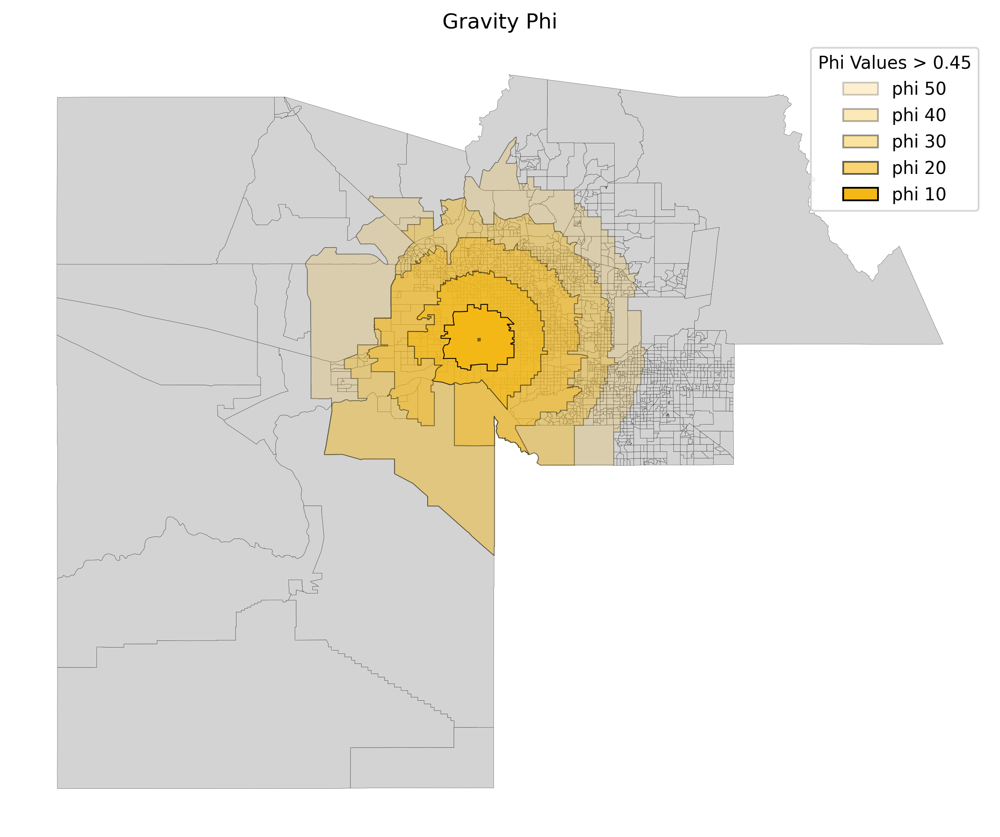

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
filtered_gpd_df_distance_zero = gpd_df[gpd_df['distance'] == 0]

census_block_groups.plot(
    ax=ax,
    edgecolor='black',
    color='lightgrey',
    linewidth=0.1
)

phi_values = ['phi 50', 'phi 40', 'phi 30', 'phi 20', 'phi 10']
base_color = '#f4b816' 

alpha_values = [0.2, 0.3, 0.4, 0.6, 1]

phi_percent = 0.45

for i, phi in enumerate(phi_values):
    alpha = alpha_values[i]  

    filtered_phi = gpd_df[gpd_df[phi] > phi_percent]

    dissolved_phi = filtered_phi.dissolve()

    if not dissolved_phi.empty:
        dissolved_phi.plot(
            ax=ax,
            color=base_color,
            edgecolor='black',  
            linewidth=0.5,  
            alpha=alpha,
        )

filtered_gpd_df_distance_zero.plot(
    ax=ax,
    color='black',
    edgecolor='black',
    linewidth=0.005,
    alpha=0.5,
)

ax.axis('off')
ax.set_title('Gravity Phi')

legend_handles = [Patch(facecolor=base_color, edgecolor='black', alpha=alpha, label=phi) for alpha, phi in zip(alpha_values, phi_values)]
ax.legend(handles=legend_handles, title=f"Phi Values > {phi_percent}")

plt.show()

# Data for good


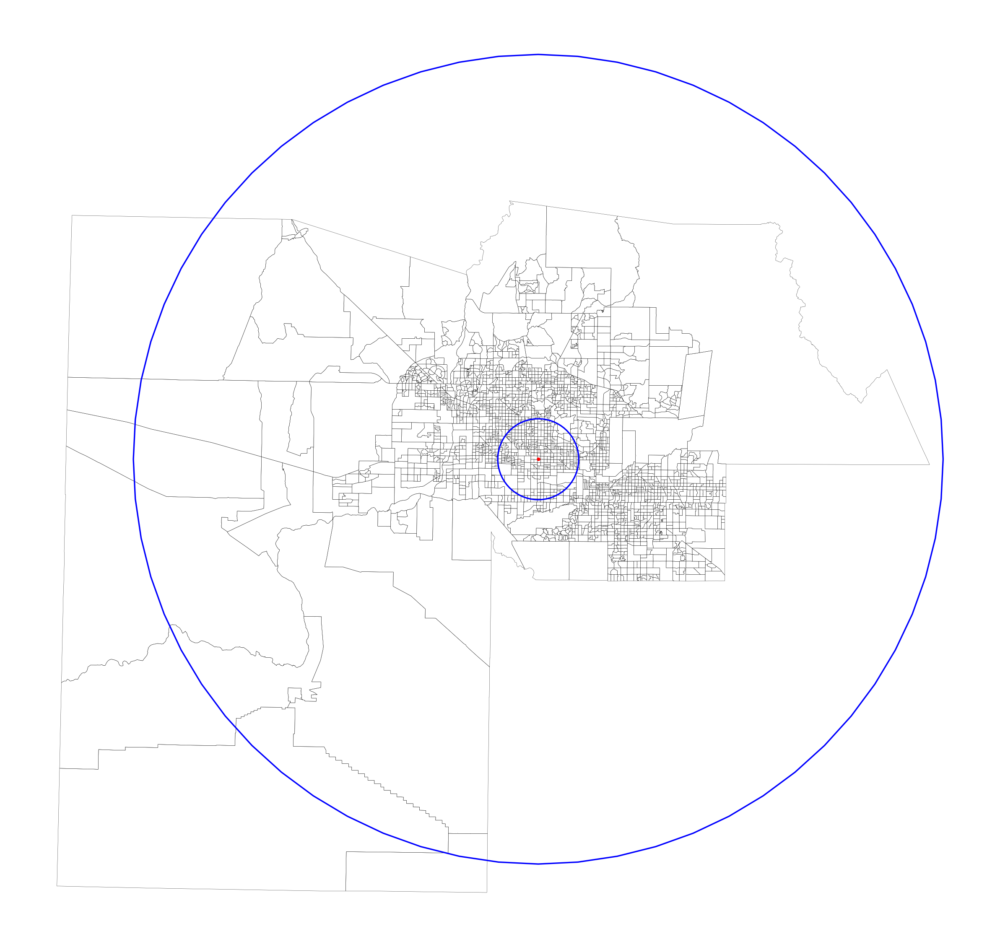

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
census_block_groups.plot(linewidth=0.1, ax=ax, edgecolor='black', color='none')

CBG = Point(-112.08022800920108, 33.473284493195884)

census_block_groups = census_block_groups.to_crs(epsg=26912)

CBG_series = GeoSeries([CBG], crs="EPSG:4326")
CBG_projected = CBG_series.to_crs(epsg=26912)

for x, y in zip(CBG_projected.geometry.x, CBG_projected.geometry.y):
    ax.plot(x, y, marker='o', color='red', markersize=1)

circle_10km = CBG_projected.geometry.iloc[0].buffer(10000)  
circle_100km = CBG_projected.geometry.iloc[0].buffer(100000)  

circles = GeoSeries([circle_10km, circle_100km], crs=census_block_groups.crs)
circles.plot(ax=ax, facecolor='none', edgecolor='blue', linewidth=0.8)

ax.axis('off')
plt.show()


In [38]:
import pandas as pd
import os
from datetime import datetime, timedelta

base_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Data_for_good'

# Initialize an empty DataFrame to hold all the data
all_data = pd.DataFrame()

# List all folders in the base path that match the specific pattern
folders = [f for f in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, f)) and 'movement-distribution-data-for-good-at-meta' in f]

# Loop through each folder
for folder in folders:
    print(f"Processing folder: {folder}")
    folder_path = os.path.join(base_path, folder)
    
    # Extract start and end dates from the folder name
    dates = folder.split('_')[-3:-1]  
    start_date = datetime.strptime(dates[0], '%Y-%m-%d')
    end_date = datetime.strptime(dates[1], '%Y-%m-%d')
    
    # Generate dates within the start and end date range
    current_date = start_date
    while current_date < end_date:
        # Format the filename based on the current date
        filename = f"1922039342088483_{current_date.strftime('%Y-%m-%d')}.csv"
        file_path = os.path.join(folder_path, filename)
        
        # Check if the file exists
        if os.path.exists(file_path):
            # Load the data from the file
            data = pd.read_csv(file_path)
            
            # Add a date column to the data
            data.loc[:, 'date'] = current_date.strftime('%Y-%m-%d')
            
            # Append the data to the all_data DataFrame
            all_data = pd.concat([all_data, data], ignore_index=True)
        
        # Move to the next day
        current_date += timedelta(days=1)

# At this point, all_data contains all the data from the files without filtering on gadm_id
data

Processing folder: movement-distribution-data-for-good-at-meta_2023-10-01_2023-11-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-05-01_2023-06-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2022-12-01_2023-01-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-03-01_2023-04-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-01-01_2023-02-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-08-01_2023-09-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-07-01_2023-08-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-04-01_2023-05-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-09-01_2023-10-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-11-01_2023-12-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-02-01_2023-03-01_csv
Processing folder: mo

,gadm_id,gadm_name,country,polygon_level,home_to_ping_distance_category,distance_category_ping_fraction,ds,date
0,USA.44.68_1,Ector,USA,2,"[10, 100)",0.135993,2023-06-30,2023-06-30
1,ROU.35.25_1,Iacobeni,ROU,2,"[10, 100)",0.066745,2023-06-30,2023-06-30
2,BGR.12.4_1,Radomir,BGR,2,100+,0.007242,2023-06-30,2023-06-30
3,PNG.3.5_1,Kundiawa-Gembogl,PNG,2,"[10, 100)",-0.004746,2023-06-30,2023-06-30
4,ROU.6.45_1,Sieu-magherus,ROU,2,0,0.353236,2023-06-30,2023-06-30
...,...,...,...,...,...,...,...,...
158383,USA.14.68_1,Monroe,USA,2,"(0, 10)",0.457941,2023-06-30,2023-06-30
158384,MNG.19.9_1,Sükhbaatar,MNG,2,100+,0.010280,2023-06-30,2023-06-30
158385,USA.35.39_1,Richland,USA,2,0,0.322477,2023-06-30,2023-06-30
158386,KEN.8.4_1,Kasipul,KEN,2,100+,0.016590,2023-06-30,2023-06-30


In [42]:
usa_data = all_data[all_data['gadm_id'] == 'USA.3.10_1']
usa_data

KeyboardInterrupt: 

In [46]:
AZ_data = usa_data[all_data['gadm_name'] == 'Navajo']
AZ_data

/var/folders/_v/4q2_l88n1vndy51_ksbfylnc0000gn/T/ipykernel_28192/395967209.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  AZ_data = usa_data[all_data['gadm_name'] == 'Navajo']


,gadm_id,gadm_name,country,polygon_level,home_to_ping_distance_category,distance_category_ping_fraction,ds,date
6301,USA.3.10_1,Navajo,USA,2,100+,0.060669,2023-10-01,2023-10-01
6346,USA.3.10_1,Navajo,USA,2,"(0, 10)",0.482837,2023-10-01,2023-10-01
99450,USA.3.10_1,Navajo,USA,2,0,0.401372,2023-10-01,2023-10-01
116439,USA.3.10_1,Navajo,USA,2,"[10, 100)",0.055012,2023-10-01,2023-10-01
182764,USA.3.10_1,Navajo,USA,2,0,0.365318,2023-10-02,2023-10-02
...,...,...,...,...,...,...,...,...
57556906,USA.3.10_1,Navajo,USA,2,"(0, 10)",0.485245,2023-06-29,2023-06-29
57591361,USA.3.10_1,Navajo,USA,2,"(0, 10)",0.473545,2023-06-30,2023-06-30
57591578,USA.3.10_1,Navajo,USA,2,"[10, 100)",0.084367,2023-06-30,2023-06-30
57642131,USA.3.10_1,Navajo,USA,2,100+,0.093843,2023-06-30,2023-06-30


In [53]:
usa_data.to_csv('Movement_Distribution_USA.csv', index=False)


In [51]:
usa_data['gadm_name'].unique()

array(['Faulkner', 'Coweta', 'Miami', ..., 'Hickory', 'Morrison',
       'Kalawao'], dtype=object)

In [37]:
import pandas as pd
import os
from datetime import datetime, timedelta

base_path = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Data_for_good'

maricopa_gadm_id = "USA.3.8_1"  

all_data = pd.DataFrame()

folders = [f for f in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, f)) and 'movement-distribution-data-for-good-at-meta' in f]

for folder in folders:
    print(f"Processing folder: {folder}")
    folder_path = os.path.join(base_path, folder)
    
    
    dates = folder.split('_')[-3:-1]  
    start_date = datetime.strptime(dates[0], '%Y-%m-%d')
    end_date = datetime.strptime(dates[1], '%Y-%m-%d')
    
    current_date = start_date
    while current_date < end_date:
        filename = f"1922039342088483_{current_date.strftime('%Y-%m-%d')}.csv"
        file_path = os.path.join(folder_path, filename)
        
        if os.path.exists(file_path):
            data = pd.read_csv(file_path)
            
            filtered_data = data[data['gadm_id'] == maricopa_gadm_id].copy()
            filtered_data.loc[:, 'date'] = current_date.strftime('%Y-%m-%d')
            
            all_data = pd.concat([all_data, filtered_data], ignore_index=True)
        
        current_date += timedelta(days=1)


all_data

Processing folder: movement-distribution-data-for-good-at-meta_2023-10-01_2023-11-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-05-01_2023-06-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2022-12-01_2023-01-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-03-01_2023-04-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-01-01_2023-02-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-08-01_2023-09-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-07-01_2023-08-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-04-01_2023-05-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-09-01_2023-10-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-11-01_2023-12-01_csv
Processing folder: movement-distribution-data-for-good-at-meta_2023-02-01_2023-03-01_csv
Processing folder: mo

,gadm_id,gadm_name,country,polygon_level,home_to_ping_distance_category,distance_category_ping_fraction,ds,date
0,USA.3.8_1,Maricopa,USA,2,100+,0.019353,2023-10-01,2023-10-01
1,USA.3.8_1,Maricopa,USA,2,"[10, 100)",0.074005,2023-10-01,2023-10-01
2,USA.3.8_1,Maricopa,USA,2,"(0, 10)",0.500172,2023-10-01,2023-10-01
3,USA.3.8_1,Maricopa,USA,2,0,0.406471,2023-10-01,2023-10-01
4,USA.3.8_1,Maricopa,USA,2,"[10, 100)",0.122654,2023-10-02,2023-10-02
...,...,...,...,...,...,...,...,...
1455,USA.3.8_1,Maricopa,USA,2,"[10, 100)",0.133464,2023-06-29,2023-06-29
1456,USA.3.8_1,Maricopa,USA,2,0,0.363071,2023-06-30,2023-06-30
1457,USA.3.8_1,Maricopa,USA,2,100+,0.016778,2023-06-30,2023-06-30
1458,USA.3.8_1,Maricopa,USA,2,"[10, 100)",0.133764,2023-06-30,2023-06-30


gadm_id gadm_name country polygon_level
USA.3.8_1 Maricopa USA 2


In [72]:
dates = pd.date_range(start="2022-12-01", end="2023-11-30", freq='D')


# Filter based on 'ds' if it's a column
if 'ds' in pivot_data.columns:
    pivot_data_filtered = pivot_data[pivot_data['ds']]  # This assumes 'ds' is a boolean column
else:
    # If 'ds' is meant to be the index name, then it's already being used as such
    pivot_data_filtered = pivot_data

pivot_data_filtered.head() 

home_to_ping_distance_category,"(0, 10)",0,100+,"[10, 100)"
ds,,,,
2022-12-01,0.532040,0.345305,0.054453,0.068275
2022-12-02,0.508853,0.343127,0.079330,0.068453
2022-12-03,0.503541,0.373870,0.064570,0.058019
2022-12-04,0.499483,0.390998,0.065335,0.044206
2022-12-05,0.527786,0.360414,0.044363,0.067531


In [ ]:
maricopa_gadm_id = "USA.3.8_1"  
maricopa_gadm_id = "USA.33.32_1" # New York
maricopa_gadm_id = "USA.3.10_1" # Navajo 
maricopa_gadm_id = "USA.3.3_1" # Coconino


In [86]:
import pandas as pd
import os
from datetime import datetime, timedelta

# Base directory and file pattern
base_dir = '/Users/alexandernez/Desktop/Github/Epymorph_vignettes/scratch/Data_for_good/movement-distribution-data-for-good-at-meta_2023-08-01_2023-09-01_csv'
file_pattern = "1922039342088483_{}.csv"

maricopa_gadm_id = "USA.3.10_1"

start_date = datetime(2023, 8, 1)
end_date = datetime(2023, 9, 1)

combined_data = pd.DataFrame()

current_date = start_date
while current_date <= end_date:
    filename = file_pattern.format(current_date.strftime('%Y-%m-%d'))
    file_path = os.path.join(base_dir, filename)
    
    if os.path.exists(file_path):
        data = pd.read_csv(file_path)
        filtered_data = data[data['gadm_id'] == maricopa_gadm_id]
        
        combined_data = pd.concat([combined_data, filtered_data], ignore_index=True)
    else:
        print(f"File not found: {file_path}")
    
    current_date += timedelta(days=1)

combined_data

,gadm_id,gadm_name,country,polygon_level,home_to_ping_distance_category,distance_category_ping_fraction,ds
0,USA.3.10_1,Navajo,USA,2,100+,0.044267,2023-08-01
1,USA.3.10_1,Navajo,USA,2,0,0.365612,2023-08-01
2,USA.3.10_1,Navajo,USA,2,"(0, 10)",0.500713,2023-08-01
3,USA.3.10_1,Navajo,USA,2,"[10, 100)",0.089387,2023-08-01
4,USA.3.10_1,Navajo,USA,2,100+,0.042726,2023-08-02
...,...,...,...,...,...,...,...
123,USA.3.10_1,Navajo,USA,2,"[10, 100)",0.091554,2023-08-31
124,USA.3.10_1,Navajo,USA,2,"(0, 10)",0.466517,2023-09-01
125,USA.3.10_1,Navajo,USA,2,"[10, 100)",0.085282,2023-09-01
126,USA.3.10_1,Navajo,USA,2,0,0.347786,2023-09-01


In [87]:
all_data['ds'] = pd.to_datetime(all_data['ds'])

grouped_data = all_data.groupby(['ds', 'home_to_ping_distance_category'])['distance_category_ping_fraction'].mean().reset_index()

pivot_data = grouped_data.pivot(index='ds', columns='home_to_ping_distance_category', values='distance_category_ping_fraction')
pivot_data

home_to_ping_distance_category,"(0, 10)",0,100+,"[10, 100)"
ds,,,,
2022-12-01,0.493370,0.372871,0.010237,0.123520
2022-12-02,0.493176,0.363919,0.012368,0.130536
2022-12-03,0.500787,0.392423,0.011011,0.095780
2022-12-04,0.503046,0.412310,0.015580,0.069064
2022-12-05,0.493331,0.380776,0.010872,0.115026
...,...,...,...,...
2023-11-26,0.497419,0.411062,0.023441,0.068081
2023-11-27,0.491448,0.376800,0.012576,0.119183
2023-11-28,0.490856,0.370788,0.009642,0.128708


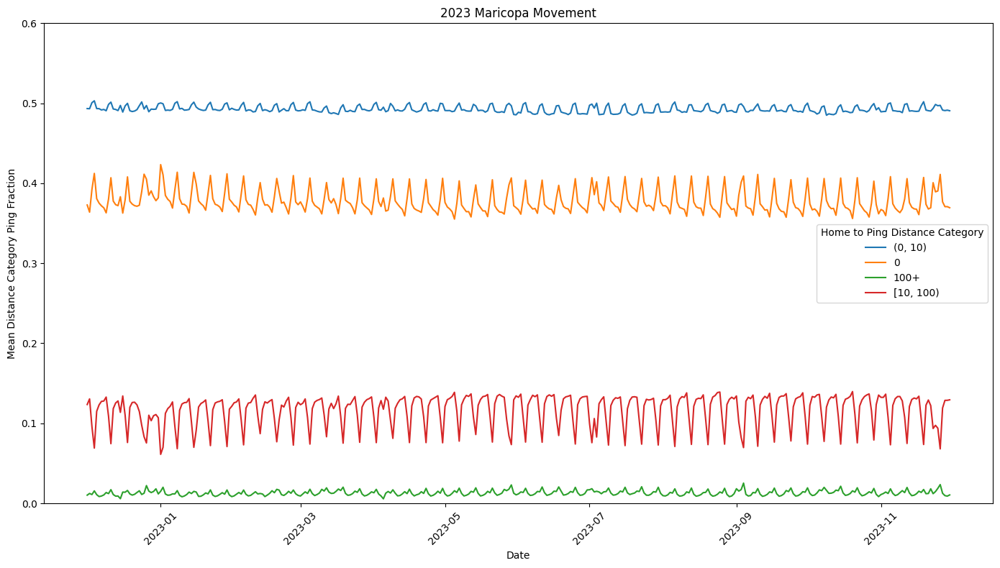

In [88]:
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 8))
for category in pivot_data.columns:
    plt.plot(pivot_data.index, pivot_data[category], label=category)

plt.title(f"2023 {all_data['gadm_name'][0]} Movement")
plt.xlabel('Date')
plt.ylabel('Mean Distance Category Ping Fraction')
plt.legend(title='Home to Ping Distance Category', loc='best')
plt.xticks(rotation=45)  
plt.tight_layout()
plt.ylim(0, 0.6)  
plt.show()



In [75]:
holidays

DatetimeIndex(['2022-12-26', '2023-01-02', '2023-01-16', '2023-02-20',
               '2023-05-29', '2023-06-19', '2023-07-04', '2023-09-04',
               '2023-10-09', '2023-11-10', '2023-11-23'],
              dtype='datetime64[ns]', freq=None)

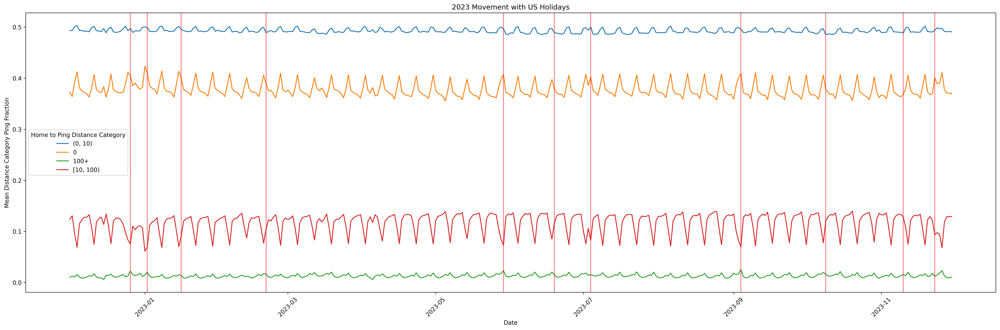

In [89]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pandas.tseries.holiday import USFederalHolidayCalendar

# Create a calendar object
cal = USFederalHolidayCalendar()
holidays = cal.holidays(start=pivot_data.index.min(), end=pivot_data.index.max())

plt.figure(figsize=(24, 8), dpi=300)

for category in pivot_data.columns:
    plt.plot(pivot_data.index, pivot_data[category], label=category)


# Plotting the holidays
for day in holidays:
    if day in pivot_data.index:  # Check if the holiday is within the index range
        plt.axvline(day, color='r', linestyle='-', alpha=0.5)  # Mark the holiday with a red line

plt.title('2023 Movement with US Holidays')
plt.xlabel('Date')
plt.ylabel('Mean Distance Category Ping Fraction')
plt.legend(title='Home to Ping Distance Category')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [82]:
pivot_data

home_to_ping_distance_category,"(0, 10)",0,100+,"[10, 100)"
ds,,,,
2022-12-01,0.532040,0.345305,0.054453,0.068275
2022-12-02,0.508853,0.343127,0.079330,0.068453
2022-12-03,0.503541,0.373870,0.064570,0.058019
2022-12-04,0.499483,0.390998,0.065335,0.044206
2022-12-05,0.527786,0.360414,0.044363,0.067531
...,...,...,...,...
2023-11-26,0.482123,0.384930,0.090473,0.042432
2023-11-27,0.514917,0.369592,0.050461,0.065135
2023-11-28,0.527508,0.363236,0.039004,0.070223


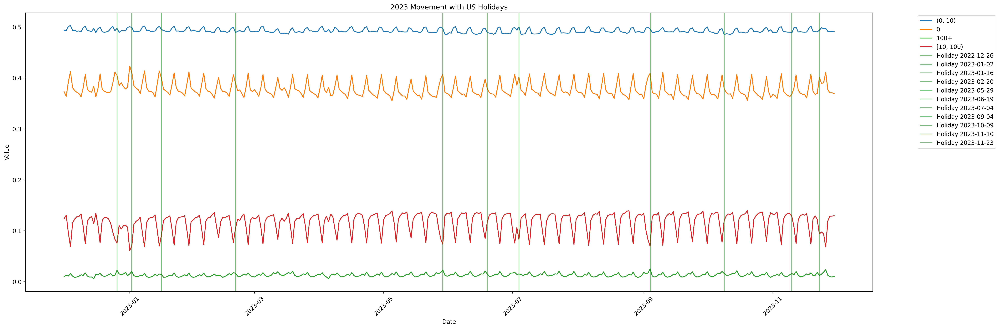

In [90]:
import matplotlib.pyplot as plt
import pandas as pd
from pandas.tseries.holiday import USFederalHolidayCalendar

# Create a calendar object
cal = USFederalHolidayCalendar()
holidays = cal.holidays(start=pivot_data.index.min(), end=pivot_data.index.max())

plt.figure(figsize=(24, 8), dpi=300)

# Let's assume there's only one category for simplicity
for category in pivot_data.columns:
    plt.plot(pivot_data.index, pivot_data[category], label=category)

weekends = pivot_data.index[pivot_data.index.weekday >= 5]


# Plotting the holidays with a unique color and adding them to the legend
for day in holidays:
    if day in pivot_data.index:
        plt.axvline(day, color='g', linestyle='-', alpha=0.5, label=f'Holiday {day.date()}')

handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), bbox_to_anchor=(1.05, 1), loc='upper left')

plt.title('2023 Movement with US Holidays')
plt.xlabel('Date')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

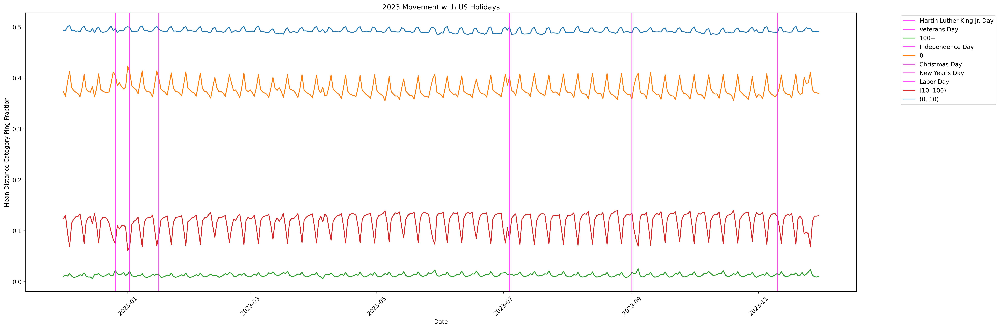

In [95]:
import pandas as pd
from pandas.tseries.offsets import DateOffset, WeekOfMonth
from pandas.tseries.holiday import AbstractHolidayCalendar, Holiday, nearest_workday

# Correct the Thanksgiving function
def Thanksgiving(year):
    # Fourth Thursday in November
    return pd.Timestamp(f"{year}-11-01") + WeekOfMonth(week=3, weekday=3)

# Define the custom holiday calendar class with holiday names
class NamedUSFederalHolidayCalendar(AbstractHolidayCalendar):
    rules = [
        Holiday('New Year\'s Day', month=1, day=1, observance=nearest_workday),
        Holiday('Martin Luther King Jr. Day', month=1, day=15, observance=nearest_workday),
        # ... Add other holidays here ...
        Holiday('Independence Day', month=7, day=4, observance=nearest_workday),
        Holiday('Labor Day', month=9, day=1, observance=nearest_workday),
        Holiday('Veterans Day', month=11, day=11, observance=nearest_workday),
        Holiday('Thanksgiving Day', year=datetime.now().year, month=11, day=1, observance=Thanksgiving),  # Corrected rule
        Holiday('Christmas Day', month=12, day=25, observance=nearest_workday),
    ]

# Instantiate the custom calendar
named_cal = NamedUSFederalHolidayCalendar()

# Create a date range for one year
dates = pd.date_range(start="2022-12-01", end="2023-11-30", freq='D')

# Get the holidays and their names within our date range
holidays = named_cal.holidays(start=pivot_data.index.min(), end=pivot_data.index.max(), return_name=True)

# Plotting the data
plt.figure(figsize=(24, 8), dpi=300)

# Assuming there are different categories to plot, we can iterate over them
for category in pivot_data.columns:
    plt.plot(pivot_data.index, pivot_data[category], label=category)


# Highlighting holidays with names in the legend
for day, name in holidays.items():
    if day in pivot_data.index:  # Check if the holiday is within the index range
        plt.axvline(day, color='magenta', linestyle='-', alpha=0.7, label=name)

# Deduplicate legend entries
handles, labels = plt.gca().get_legend_handles_labels()
unique = {(h, l) for i, (h, l) in enumerate(zip(handles, labels)) if l not in labels[:i]}
plt.legend(*zip(*unique), bbox_to_anchor=(1.05, 1), loc='upper left')

plt.title('2023 Movement with US Holidays')
plt.xlabel('Date')
plt.ylabel('Mean Distance Category Ping Fraction')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


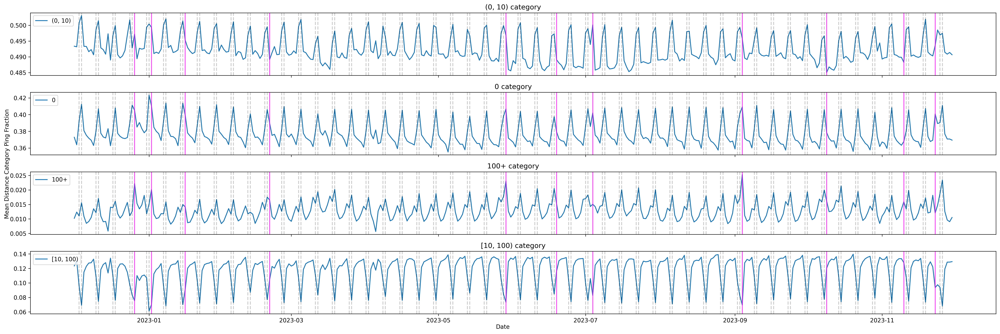

: 

In [105]:
# Plotting
fig, axs = plt.subplots(len(pivot_data.columns), 1, figsize=(24, 8), dpi=300, sharex=True)

for i, category in enumerate(pivot_data.columns):
    axs[i].plot(pivot_data.index, pivot_data[category], label=category)
    
    # Mark weekends
    weekends = pivot_data.index[pivot_data.index.weekday >= 5]
    for day in weekends:
        axs[i].axvline(day, color='k', linestyle='--', alpha=0.2)
        
    # Mark holidays with a unique color
    for day, name in holidays.items():
        if day in pivot_data.index:
            axs[i].axvline(day, color='magenta', linestyle='-', alpha=0.7)
    
    # Add category legend
    axs[i].legend(loc='upper left')
    
    # Add a title to each subplot
    axs[i].set_title(f'{category} category')

# Create a legend for the holidays
from matplotlib.lines import Line2D
custom_lines = [Line2D([0], [0], color='magenta', lw=4)]

# Set common labels
fig.text(0.5, 0.004, 'Date', ha='center')
fig.text(0.0006, 0.5, 'Mean Distance Category Ping Fraction', va='center', rotation='vertical')

# Tight layout to adjust subplots to fit in to the figure area.
fig.tight_layout()

# Show the plot
plt.show()